
# <span style = 'color:cyan'> Time Series Analysis</span>

## <span style = 'color:cyan'>  Forecasting Zillow Real Estate Prices</span>

### Authors - Group 13

 * Henry Mativo
 * Florence Nguuni
 * Abdikarim Gedi 
 * Swaleh Athuman
 * Sharon Chelangat
 * Cliff Shitote

## 1.0 Business Understanding
### 1.1 Introduction

In 2021, the United States real estate industry boasted a staggering valuation of USD 3.69 trillion. Forecasts projected a promising future, with an estimated compound annual growth rate of 5.2% anticipated between 2022 and 2030. This projected growth, coupled with the rising population rates in the US, presents an immensely lucrative opportunity for real estate investors to capitalize on substantial profits. However, success in this realm hinges upon the prudent management of risk and making astute investment choices.

According to the experts at [People's Capital Group](https://www.peoplescapitalgroup.com/average-roi-real-estate/), residential properties exhibit an average annual return of 10.6%, while commercial properties yield an average return of 9.5%. These figures illustrate the potential for lucrative returns in the real estate market, further emphasizing the importance of making well-informed investment decisions and adopting effective risk management strategies.

### 1.2 Problem Statement

The stakeholder for this project is a real estate investment firm aiming to construct residential homes in the United States' most lucrative locations, ensuring a high return on their investment. To achieve this goal, the project focuses on conducting a time series analysis utilizing a Zillow dataset that encompasses various locations across the country.

Specifically, the project involves analyzing house sale prices spanning from 1996 to 2018. By leveraging this data, the aim is to identify the top five locations that offer the highest Return on Investment (ROI) potential. Additionally, considering the stakeholder's risk-averse nature, the project aims to recommend locations characterized by low price volatility. This quality will enable the model to provide reliable predictions, enhancing the stakeholder's ability to make informed investment decisions.

Overall, the project centers on utilizing time series analysis techniques and the Zillow dataset to pinpoint the top ten locations in the US that not only offer a high ROI but also exhibit low price volatility, aligning with the risk preferences of the real estate investment firm.

### 1.3 Metric of Success

For our time series analysis, we have selected the Mean Absolute Percentage Error (MAPE) as the metric of success to assess the viability of the model. MAPE has been chosen due to its ability to provide weighted error values, where errors are divided by the true values. This characteristic is particularly advantageous in handling outliers effectively. In contrast, Root Mean Square Error (RMSE) solely considers the difference between the real and predicted values, which can be misleading if outliers exist in the data.

By utilizing MAPE, we aim to obtain a comprehensive evaluation of the model's performance that accounts for both the magnitude of errors and the relative proportion they represent. This metric offers a more robust assessment and ensures that outliers do not unduly influence the perception of the model's effectiveness in generating accurate predictions.

Therefore, MAPE has been chosen as the preferred metric to gauge the model's performance in our time series analysis. It provides a reliable indication of the model's ability to forecast accurately, considering the potential presence of outliers in the dataset.

### 1.4 Project Scope

The central objective of this project is to perform a comprehensive time series analysis to forecast and identify the top ten locations for investment based on Return on Investment (ROI). By leveraging historical data and employing predictive modeling techniques, the project aims to determine the most promising locations that offer the highest potential returns for real estate investors. Through this analysis, the project seeks to provide actionable insights and recommendations that will assist the stakeholders in making informed investment decisions in pursuit of optimal ROI.

### 1.5 Problem Questions
1. What are the zipcodes with the best Return On Investment?
2. What makes these locations so lucrative?
4. Where are the locations/zipcodes of the houses with the highest price volatility?
5. Can future median house prices be effectively predicted?

### 1.6 Main Project Objective
1. Provide effective real estate investment recommendations to the stakeholder.

#### Specific Objectives
1. **ROI Analysis**: We have evaluated the return on investment (ROI) for
different zip codes, allowing investors to identify areas with the highest
potential returns. By exploring the top 10 zip codes with the highest ROI,
investors can make informed decisions about where to allocate their capital.

2. **Price Volatility Analysis**: We have examined the price volatility in
different locations, helping investors assess the level of risk associated with
specific areas. By identifying the top 10 zip codes with the highest price
volatility, investors can gain insights into areas where market fluctuations may
present unique opportunities or challenges.

3. **Property Value Analysis**: We have analyzed the average median house
prices for cities and states, providing a comprehensive understanding of areas
with the highest valued property. By exploring the top 10 cities and states with 
the highest property values, investors can identify potential hotspots for
investment.

4. **Trend Analysis**: We have examined the trend of property prices over
the years, allowing investors to identify long-term patterns and make
predictions about future market trends. By understanding the historical price
movements, investors can make informed decisions about the timing of their
investments.

### 1.7  Defining the Experimental Design

- Import the relevant libraries used in the analysis.

- Load dataset

- Read and explore the dataset we will use for our project.

- Data Cleaning & Preparation

- Exploratory Data Analysis (EDA)

- Data Pre-processing

- Modelling & Evaluation

- Challenging the model

- Conclusion

- Recommendations


## 2.0 Data Understanding
The dataset utilized in this project consists of historical median house prices sampled from various states in the United States. The data spans a period of 22 years, specifically from April 1996 to April 2018. The information was obtained from the official website of Zillow, a prominent real estate and rental marketplace.

The dataset comprises a total of 14,723 rows and 272 columns. Among these columns, four are categorical variables, while the remaining columns are numerical in nature.

Here is a brief overview of the column names and their descriptions:

* `RegionID`: A unique identifier assigned to each region.
* `RegionName`: The names of the regions, typically representing zip codes.
* `City`: The corresponding city names associated with the regions.
* `State`: The names of the states to which the regions belong.
* `Metro`: The names of the metropolitan areas to which the regions are affiliated.
* `County Name`: The names of the counties where the regions are located.
* `Size Rank`: The ranking of zip codes based on their level of urbanization.
* `Date Columns (265 Columns)`: These columns represent median house prices recorded across different years.

By utilizing this dataset, the project aims to extract insights and patterns from the historical median house prices in order to predict the top investment locations with the highest Return on Investment (ROI).

## 3.0 Data Preparation
### 3.1 Importing Libraries

In [1]:
# importing relevant libraries

# Analysis libraries
import pandas as pd 
import numpy as np

# Visualization libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# Warning libraries
import warnings
warnings.simplefilter("ignore")
warnings.filterwarnings('ignore')

# # Modelling libraries
# from statsmodels.graphics.tsaplots import plot_pacf
# from statsmodels.graphics.tsaplots import plot_acf
# from statsmodels.tsa.arima.model import ARIMA
import statsmodels.api as sm
# from statsmodels.tsa.stattools import adfuller
# # !pip install pmdarima
import pmdarima as pm #a library to help with auto_arima
import itertools

# # Metrics Libraries
from sklearn.metrics import mean_absolute_percentage_error


### 3.2 Loading Data

In [2]:
# loading the dataset
df = pd.read_csv('zillow_data.csv')
df.head()

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,...,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,...,1005500,1007500,1007800,1009600,1013300,1018700,1024400,1030700,1033800,1030600
1,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,235700.0,236900.0,236700.0,...,308000,310000,312500,314100,315000,316600,318100,319600,321100,321800
2,91982,77494,Katy,TX,Houston,Harris,3,210400.0,212200.0,212200.0,...,321000,320600,320200,320400,320800,321200,321200,323000,326900,329900
3,84616,60614,Chicago,IL,Chicago,Cook,4,498100.0,500900.0,503100.0,...,1289800,1287700,1287400,1291500,1296600,1299000,1302700,1306400,1308500,1307000
4,93144,79936,El Paso,TX,El Paso,El Paso,5,77300.0,77300.0,77300.0,...,119100,119400,120000,120300,120300,120300,120300,120500,121000,121500


In [3]:
#Getting data information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14723 entries, 0 to 14722
Columns: 272 entries, RegionID to 2018-04
dtypes: float64(219), int64(49), object(4)
memory usage: 30.6+ MB


In [4]:
df.columns

Index(['RegionID', 'RegionName', 'City', 'State', 'Metro', 'CountyName',
       'SizeRank', '1996-04', '1996-05', '1996-06',
       ...
       '2017-07', '2017-08', '2017-09', '2017-10', '2017-11', '2017-12',
       '2018-01', '2018-02', '2018-03', '2018-04'],
      dtype='object', length=272)

In [5]:
# Description of the columns
columns = {'Columns': ['RegionID','RegionName','City','State','Metro','County Name','Size Rank','Date Columns (265 Columns)'],
'Description':['Unique region identifier','Names of the Regions (Zipcodes)','City names for the regions',
               'Names of the states','Names of metropolitan areas','Names of counties','Rank of Zipcodes by urbanization',
              'Median house prices across the years']}
pd.DataFrame(columns)

,Columns,Description
0,RegionID,Unique region identifier
1,RegionName,Names of the Regions (Zipcodes)
2,City,City names for the regions
3,State,Names of the states
4,Metro,Names of metropolitan areas
5,County Name,Names of counties
6,Size Rank,Rank of Zipcodes by urbanization
7,Date Columns (265 Columns),Median house prices across the years


In [6]:
df.dtypes

RegionID       int64
RegionName     int64
City          object
State         object
Metro         object
               ...  
2017-12        int64
2018-01        int64
2018-02        int64
2018-03        int64
2018-04        int64
Length: 272, dtype: object

In [7]:
# Checking the shape of dataset
print('Number of rows:',df.shape[0])
print('Number of columns:',df.shape[1])

Number of rows: 14723
Number of columns: 272


### 3.3 Data Cleaning


To ensure the development of a robust and accurate model, several data cleaning techniques will be applied to the dataset. The following techniques will be employed:

1. `Completeness`: This technique involves addressing missing values within the dataset. Steps will be taken to identify and handle missing data appropriately, either through imputation or removal, to ensure that the dataset is complete.

2. `Consistency`: The consistency of the data will be examined to identify any discrepancies or irregularities. Inconsistencies in variables, such as conflicting formats or conflicting information within the dataset, will be addressed and resolved to maintain data integrity.

3. `Validity`: Validity refers to the accuracy and relevance of the data. Data validation techniques will be applied to verify that the values within each variable align with expected ranges or predefined criteria. Any invalid or erroneous data points will be rectified or removed from the dataset.

4. `Collinearity`: Collinearity examines the presence of highly correlated variables. Multicollinearity can affect the model's stability and interpretability. Techniques such as correlation analysis will be utilized to identify highly correlated variables. If necessary, appropriate measures, such as feature selection or dimensionality reduction, will be implemented to address collinearity issues.

5. `Outlier removal`: Outliers, which are extreme or unusual data points, can adversely impact the model's performance. Robust statistical techniques will be employed to detect and handle outliers effectively. Outliers may be removed or transformed to minimize their influence on the analysis and modeling process.

By applying these data cleaning techniques, the dataset will be refined and prepared, ensuring the reliability and accuracy of the data before proceeding with the subsequent stages of analysis and modeling.

### 3.3.1 Completeness

To achieve completeness in our data, I will be checking for missing values in the data.

In [8]:
# Check for null values 
print(f'The data has {df.isna().sum().sum()} missing values')

The data has 157934 missing values


In [9]:
# Define a function to explore missing data
def missing_data(df):
    missing_data = df.isna().sum()
    missing_data = missing_data[missing_data>0]
    return missing_data.to_frame()

In [10]:
# expanding the number of visible columns
pd.set_option('display.max_columns', None)

In [11]:
# Apply missing_data function to the dataframe
missing_data(df).T

,Metro,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,1997-01,1997-02,1997-03,1997-04,1997-05,1997-06,1997-07,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,1998-06,1998-07,1998-08,1998-09,1998-10,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06
0,1043,1039,1039,1039,1039,1039,1039,1039,1039,1039,1039,1039,1039,1039,1039,1039,1038,1038,1038,1038,1038,1038,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,1036,918,918,918,918,918,918,887,887,887,887,887,887,866,866,866,866,866,866,814,814,801,801,801,801,723,723,723,723,723,723,667,667,667,667,667,667,640,640,640,640,640,640,620,620,620,620,620,620,613,613,613,613,613,613,607,607,607,607,607,607,598,598,598,598,598,598,587,587,587,587,587,587,580,580,580,580,580,580,579,579,349,349,349,349,308,308,308,308,308,308,275,275,275,275,275,275,251,251,251,251,251,251,224,224,224,224,224,224,206,206,206,206,206,206,151,151,151,151,151,151,109,109,109,109,109,109,56,56,56,56,56,56


- The date columns have 1039 missing values each while metro column has 1043 missing values.

- The missing values in the date columns will be filled through interpolation.
- The missing values in the metro column will be replaced with 'missing' as this may be a useful indicator.

In [12]:
# imputing the missing values by replacing them with 'missing'
df.Metro.fillna('missing', inplace=True)

In [13]:
# interpolate missing values on date columns
df.interpolate(inplace=True)

In [14]:
# checking to see if missing values have been replaced
print(f'The data has {df.isna().sum().sum()} missing values')

The data has 0 missing values


### 3.3.2 Consistency

For the data to be constistent, I need to resolve any inconsistencies by checking for duplicate values in our data.

In [15]:
# checking for duplicates
print(f'The data has {df.duplicated().sum()} duplicates')

The data has 0 duplicates


The data has no duplicates hence it's consistent.

### 3.3.3 Validity 
For our data to be valid, I have to verify that every column is accurate and appropriate for this analysis and remove those that are invalid.

In [16]:
df.head(2)

,RegionID,RegionName,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,1997-01,1997-02,1997-03,1997-04,1997-05,1997-06,1997-07,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,1998-06,1998-07,1998-08,1998-09,1998-10,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,337600.0,338500.0,339500.0,340400.0,341300.0,342600.0,344400.0,345700.0,346700.0,347800.0,349000.0,350400.0,352000.0,353900.0,356200.0,358800.0,361800.0,365700.0,370200.0,374700.0,378900.0,383500.0,388300.0,393300.0,398500.0,403800.0,409100.0,414600.0,420100.0,426200.0,432600.0,438600.0,444200.0,450000.0,455900.0,462100.0,468500.0,475300.0,482500.0,490200.0,498200.0,507200.0,516800.0,526300.0,535300.0,544500.0,553500.0,562400.0,571200.0,579800.0,588100.0,596300.0,604200.0,612200.0,620200.0,627700.0,634500.0,641000.0,647000.0,652700.0,658100.0,663300.0,668400.0,673400.0,678300.0,683200.0,688300.0,693300.0,698000.0,702400.0,706400.0,710200.0,714000.0,717800.0,721700.0,725700.0,729900.0,733400.0,735600.0,737200.0,739000.0,740900.0,742700.0,744400.0,746000.0,747200.0,748000.0,749000.0,750200.0,752300.0,755300.0,759200.0,764000.0,769600.0,775600.0,781900.0,787900.0,793200.0,798200.0,803100.0,807900.0,812900.0,818100.0,823100.0,828300.0,834100.0,839800.0,845600.0,851800.0,858000.0,864400.0,870700.0,876200.0,880700.0,884400.0,887600.0,890500.0,893300.0,895500.0,897300.0,899000.0,900400.0,902000.0,904400.0,907100.0,909700.0,911900.0,913000.0,913000.0,912000.0,909300.0,905300.0,901400.0,897900.0,895400.0,893600.0,891100.0,887000.0,881700.0,875900.0,870300.0,865100.0,859000.0,851500.0,843800.0,836400.0,830700.0,827300.0,824800.0,821600.0,818300.0,814600.0,809800.0,803600.0,795500.0,786900.0,780700.0,776900.0,774700.0,774200.0,774400.0,774600.0,775600.0,777800.0,775200.0,767900.0,764700.0,766100.0,764100.0,759700.0,754900.0,746200.0,737300.0,730800.0,729300.0,730200.0,730700.0,730000.0,730100.0,730100.0,731200.0,733900.0,735500.0,735400.0,734400.0,737500.0,737700.0,733700.0,734000.0,740300.0,744600.0,750500.0,760400.0,771800.0,780600.0,

The RegionName contains zipcode data. It will be renamed to Zipcode.

In [17]:
# Rename RegionName to zipcode
df = df.rename(columns={'RegionName': 'Zipcode'})
df.head(2)

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,1996-04,1996-05,1996-06,1996-07,1996-08,1996-09,1996-10,1996-11,1996-12,1997-01,1997-02,1997-03,1997-04,1997-05,1997-06,1997-07,1997-08,1997-09,1997-10,1997-11,1997-12,1998-01,1998-02,1998-03,1998-04,1998-05,1998-06,1998-07,1998-08,1998-09,1998-10,1998-11,1998-12,1999-01,1999-02,1999-03,1999-04,1999-05,1999-06,1999-07,1999-08,1999-09,1999-10,1999-11,1999-12,2000-01,2000-02,2000-03,2000-04,2000-05,2000-06,2000-07,2000-08,2000-09,2000-10,2000-11,2000-12,2001-01,2001-02,2001-03,2001-04,2001-05,2001-06,2001-07,2001-08,2001-09,2001-10,2001-11,2001-12,2002-01,2002-02,2002-03,2002-04,2002-05,2002-06,2002-07,2002-08,2002-09,2002-10,2002-11,2002-12,2003-01,2003-02,2003-03,2003-04,2003-05,2003-06,2003-07,2003-08,2003-09,2003-10,2003-11,2003-12,2004-01,2004-02,2004-03,2004-04,2004-05,2004-06,2004-07,2004-08,2004-09,2004-10,2004-11,2004-12,2005-01,2005-02,2005-03,2005-04,2005-05,2005-06,2005-07,2005-08,2005-09,2005-10,2005-11,2005-12,2006-01,2006-02,2006-03,2006-04,2006-05,2006-06,2006-07,2006-08,2006-09,2006-10,2006-11,2006-12,2007-01,2007-02,2007-03,2007-04,2007-05,2007-06,2007-07,2007-08,2007-09,2007-10,2007-11,2007-12,2008-01,2008-02,2008-03,2008-04,2008-05,2008-06,2008-07,2008-08,2008-09,2008-10,2008-11,2008-12,2009-01,2009-02,2009-03,2009-04,2009-05,2009-06,2009-07,2009-08,2009-09,2009-10,2009-11,2009-12,2010-01,2010-02,2010-03,2010-04,2010-05,2010-06,2010-07,2010-08,2010-09,2010-10,2010-11,2010-12,2011-01,2011-02,2011-03,2011-04,2011-05,2011-06,2011-07,2011-08,2011-09,2011-10,2011-11,2011-12,2012-01,2012-02,2012-03,2012-04,2012-05,2012-06,2012-07,2012-08,2012-09,2012-10,2012-11,2012-12,2013-01,2013-02,2013-03,2013-04,2013-05,2013-06,2013-07,2013-08,2013-09,2013-10,2013-11,2013-12,2014-01,2014-02,2014-03,2014-04,2014-05,2014-06,2014-07,2014-08,2014-09,2014-10,2014-11,2014-12,2015-01,2015-02,2015-03,2015-04,2015-05,2015-06,2015-07,2015-08,2015-09,2015-10,2015-11,2015-12,2016-01,2016-02,2016-03,2016-04,2016-05,2016-06,2016-07,2016-08,2016-09,2016-10,2016-11,2016-12,2017-01,2017-02,2017-03,2017-04,2017-05,2017-06,2017-07,2017-08,2017-09,2017-10,2017-11,2017-12,2018-01,2018-02,2018-03,2018-04
0,84654,60657,Chicago,IL,Chicago,Cook,1,334200.0,335400.0,336500.0,337600.0,338500.0,339500.0,340400.0,341300.0,342600.0,344400.0,345700.0,346700.0,347800.0,349000.0,350400.0,352000.0,353900.0,356200.0,358800.0,361800.0,365700.0,370200.0,374700.0,378900.0,383500.0,388300.0,393300.0,398500.0,403800.0,409100.0,414600.0,420100.0,426200.0,432600.0,438600.0,444200.0,450000.0,455900.0,462100.0,468500.0,475300.0,482500.0,490200.0,498200.0,507200.0,516800.0,526300.0,535300.0,544500.0,553500.0,562400.0,571200.0,579800.0,588100.0,596300.0,604200.0,612200.0,620200.0,627700.0,634500.0,641000.0,647000.0,652700.0,658100.0,663300.0,668400.0,673400.0,678300.0,683200.0,688300.0,693300.0,698000.0,702400.0,706400.0,710200.0,714000.0,717800.0,721700.0,725700.0,729900.0,733400.0,735600.0,737200.0,739000.0,740900.0,742700.0,744400.0,746000.0,747200.0,748000.0,749000.0,750200.0,752300.0,755300.0,759200.0,764000.0,769600.0,775600.0,781900.0,787900.0,793200.0,798200.0,803100.0,807900.0,812900.0,818100.0,823100.0,828300.0,834100.0,839800.0,845600.0,851800.0,858000.0,864400.0,870700.0,876200.0,880700.0,884400.0,887600.0,890500.0,893300.0,895500.0,897300.0,899000.0,900400.0,902000.0,904400.0,907100.0,909700.0,911900.0,913000.0,913000.0,912000.0,909300.0,905300.0,901400.0,897900.0,895400.0,893600.0,891100.0,887000.0,881700.0,875900.0,870300.0,865100.0,859000.0,851500.0,843800.0,836400.0,830700.0,827300.0,824800.0,821600.0,818300.0,814600.0,809800.0,803600.0,795500.0,786900.0,780700.0,776900.0,774700.0,774200.0,774400.0,774600.0,775600.0,777800.0,775200.0,767900.0,764700.0,766100.0,764100.0,759700.0,754900.0,746200.0,737300.0,730800.0,729300.0,730200.0,730700.0,730000.0,730100.0,730100.0,731200.0,733900.0,735500.0,735400.0,734400.0,737500.0,737700.0,733700.0,734000.0,740300.0,744600.0,750500.0,760400.0,771800.0,780600.0,787

### 3.3.4 Uniformity

For our data to be uniform, I have to verify that every column is correct and convert them to there appropriate data type.

Region ID is a unique identifier so it will not be explored further.



In [18]:
df.dtypes

RegionID     int64
Zipcode      int64
City        object
State       object
Metro       object
             ...  
2017-12      int64
2018-01      int64
2018-02      int64
2018-03      int64
2018-04      int64
Length: 272, dtype: object

#### 3.3.4.1 Zipcode

In [19]:
# exploring the datatype of zipcode column
df.dtypes['Zipcode']

dtype('int64')

To accurately represent the locations, the Zipcode column will be converted from the integer data type to the string data type. Since zip codes are categorical identifiers that correspond to specific geographical areas, it is more appropriate to treat them as categorical variables rather than numerical ones. By converting the Zipcode column to string type, it ensures that the analysis and modeling processes treat it as a categorical feature, enabling meaningful interpretations and appropriate handling during data manipulation and modeling steps.

In [20]:
# Convert all the zipcodes to strings 
df.Zipcode = df.Zipcode.astype('string')
print(df.dtypes["Zipcode"])

string


In [21]:
# exploring the format of the zip codes
print(df.Zipcode.min())
print(df.Zipcode.max())

1001
99901


In order to ensure consistency in the representation of zip codes, the column will be restructured to have all the digits as five in number. It has been observed that some zip codes contain four digits, suggesting a missing zero at the beginning. Therefore, the column will be modified to include a leading zero for zip codes with four digits, aligning them with the standard format of five-digit zip codes. This restructuring will ensure uniformity in the zip code representation, enabling accurate analysis and modeling based on this variable.

In [22]:
# The zipcodes need to be 5 digits long, so a zero will be added to the ones that have four digits 
for i in range(len(df)):
    df.Zipcode[i] = df.Zipcode[i].rjust(5, '0')

In [23]:
# exploring the format of the zip codes
print(df.Zipcode.min())
print(df.Zipcode.max())

01001
99901


All the zipcodes are now 5 digits long

## 4.0 Data Preprocessing

### 4.1 Adding New Columns

To improve our analysis, I will be adding 2 new column from columns that share have similarities or add more analytical value.

> **Return on Investment (ROI)**

ROI is a measure of returns expected from investments.

> **Coefficient of variation (CV)**

CV is a measure of the dispersion of data points around the mean and represents the ratio of the standard deviation to the mean. It allows investors to determine how much volatility, or risk, is assumed in comparison to the amount of return expected from investments.


In [24]:
# calculating and creating a new column -ROI

df['ROI'] = (df['2018-04']/ df['1996-04'])-1



#calculating std to be used to find CV
df["std"] = df.loc[:, "1996-04":"2018-04"].std(skipna=True, axis=1)

#calculating mean to be used to find CV
df["mean"] = df.loc[:, "1996-04":"2018-04"].mean(skipna=True, axis=1)

# calculating and creating a new column - CV

df["CV"] = df['std']/df["mean"]

# dropping std and mean as they are not necessary for analysis

df.drop(["std", "mean"], inplace=True, axis=1)

In [25]:
df[["Zipcode", "ROI", "CV"]].head()

,Zipcode,ROI,CV
0,60657,2.083782,0.256487
1,75070,0.365295,0.152680
2,77494,0.567966,0.143950
3,60614,1.623971,0.237364
4,79936,0.571798,0.178326


### 4.2  Reshape from Wide to Long Format

To facilitate time series analysis, the dataframe will be transformed from a wide view to a long view format. This transformation involves restructuring the dataframe to have a single column for the Date and another column for the corresponding values. The Date column will be set as the index to establish the temporal order of the data points.

By converting the dataframe to a long view format and indexing it by the Date, the data will be organized in a sequential manner, enabling the application of time series analysis techniques such as trend analysis, seasonality detection, and forecasting. This transformation allows for a more comprehensive exploration of the temporal patterns and trends within the dataset, enhancing the accuracy and effectiveness of the subsequent time series modeling and predictions.


To ensure the availability of different perspectives for exploratory data analysis (EDA), a copy of the dataset will be made. The original dataset will be preserved in its wide view format to facilitate EDA from that perspective. Meanwhile, the copy of the dataset will be transformed into a long view format, creating a new dataframe.

By having both the long and wide view datasets, the EDA process will benefit from diverse analytical approaches. The wide view format of the original dataset allows for a comprehensive examination of the data across various columns, providing insights into the overall distribution and patterns. On the other hand, the long view format of the copied dataset enables a focused analysis on the temporal dimension, utilizing time series techniques to explore trends, seasonality, and relationships over time.

Having these two versions of the dataset, each with its own viewpoint, ensures a comprehensive and nuanced understanding of the data during the EDA phase. This approach enhances the insights derived from the analysis and provides a holistic understanding of the dataset from both wide and long view perspectives.

In [26]:
# Create a copy of the dataset to convert into long view while preserving df as a wide view for EDA
new_df = df.copy()

In [27]:
# creating a function that changes the dataframe structure from wide view to long view

def melt_df(data):
    melted = pd.melt(data, id_vars=['RegionID','Zipcode', 'City', 'State', 'Metro', 'CountyName', 'SizeRank', 
                                  'ROI', 'CV' ], var_name='Date')
    melted['Date'] = pd.to_datetime(melted['Date'], infer_datetime_format=True)
    melted = melted.dropna(subset=['value'])
    return melted

In [28]:
new_df = melt_df(new_df)

### 4.3 Convert data data to date time and indexing

Working with time series data in Python, having dates (or datetimes) in the index can be very helpful, especially if they are of DatetimeIndex type as the index allows for intuitive and efficient time-based indexing and slicing operations. It enables easy access to specific time periods, such as a particular day, month, or year. Additionally, the DatetimeIndex provides convenient methods for resampling, time shifting, and frequency conversion.

In [29]:
# Converting the date data type into date time and indexing

new_df['Date'] = pd.to_datetime(new_df['Date'], format='%m/%y')

# Set the 'Date' column as index

new_df.set_index('Date', inplace=True)

In [30]:
# renaming the column value to median_price

new_df.rename(columns = {"value" : "median_houseprice"}, inplace=True)


In [31]:
# displaying the final cleaned data
new_df.head(5)

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,ROI,CV,median_houseprice
Date,,,,,,,,,,
1996-04-01,84654,60657,Chicago,IL,Chicago,Cook,1,2.083782,0.256487,334200.0
1996-04-01,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,0.365295,0.152680,235700.0
1996-04-01,91982,77494,Katy,TX,Houston,Harris,3,0.567966,0.143950,210400.0
1996-04-01,84616,60614,Chicago,IL,Chicago,Cook,4,1.623971,0.237364,498100.0
1996-04-01,93144,79936,El Paso,TX,El Paso,El Paso,5,0.571798,0.178326,77300.0


## 5.0 Exploratory Data Analysis
This section will be the exploratory data analysis question where we will exploring and seeing the relationship the different columns

Exploration will be done on the data to determine:

1. The top 10 zipcodes/location with highest ROI
2. The zipcodes/locations with high price volatility
3. The cities/states with highest valued property
4. Whether urbanization affects property values
5. The trend of property prices over the years


The main two parts in this section are: 
>   - Categorical Columns
>   - Numerical Columns

In [32]:
new_df.dtypes

RegionID               int64
Zipcode               string
City                  object
State                 object
Metro                 object
CountyName            object
SizeRank               int64
ROI                  float64
CV                   float64
median_houseprice    float64
dtype: object

The data has ten columns, five of which are numerical and five categorical. 

#### Categorical Columns

The Categorical Columns in the dataset that we shall be analysing are:

- `Zipcode`
- `City`
- `State`
- `Metro`
- `CountyName`

###  Numerical Columns

The Numerical Columns in the dataset that we shall be analysing are:

- `RegionID`
- `SizeRank`
- `ROI`
- `CV`
- `median_houseprice`

In [33]:
#creating categorical columns
categorical_columns_list = ['Zipcode', 'City', 'State', 'Metro', 'CountyName']
categorical_columns_df = new_df[['Zipcode', 'City', 'State', 'Metro', 'CountyName']]

#creating numerical columns
numerical_columns_list = ['RegionID', 'SizeRank', 'ROI', 'CV', 'median_houseprice']
numerical_columns_df = new_df[['RegionID', 'SizeRank', 'ROI', 'CV', 'median_houseprice']]

### 5.1 Univariate Analysis
In this section, we'll explore each column in the dataset to see the distributions of features and obtain some useful insights.

###  Catergorical Univariate Analysis

In [34]:
def plot_most_popular_categorical(df, column, n=10, figsize=(8, 6)):
    """
    Plots the most popular datasets based on a given column in the dataset.

    Args:
        df (DataFrame): The pandas DataFrame containing the data.
        column (str): The column to consider for counting.
        n (int): The number of counties to plot (default: 10).
        figsize (tuple): The figure size (default: (15, 8)).
    """
    plt.figure(figsize=figsize)
    df[column].value_counts()[:n].plot(kind="barh")
    plt.xlabel("Count", fontsize=15)
    plt.ylabel(column, fontsize=15)
    plt.title(f"Most Popular {column.capitalize()}s", fontsize=20)
    plt.show()

#### What are the top 10 most popular cities?

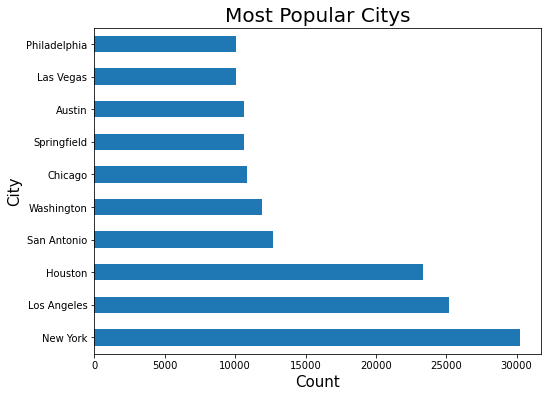

In [35]:
plot_most_popular_categorical(new_df, "City")

By analyzing this graph, you can identify the cities that have the highest representation in the dataset. The taller bars indicate cities with a larger number of properties, while shorter bars indicate cities with fewer properties in the dataset. 

###  What are the top 10 most popular states?

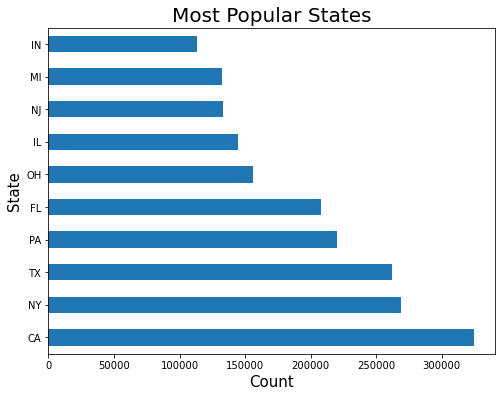

In [36]:
plot_most_popular_categorical(new_df, "State")

 Identifying the states with the highest property counts, indicating their popularity. The plot also shows the distribution of properties among different states, highlighting any significant disparities. Additionally, it offers insights into regional variations in property distribution, revealing clusters of states with similar property counts.

### What are the top 10 most popular metros?

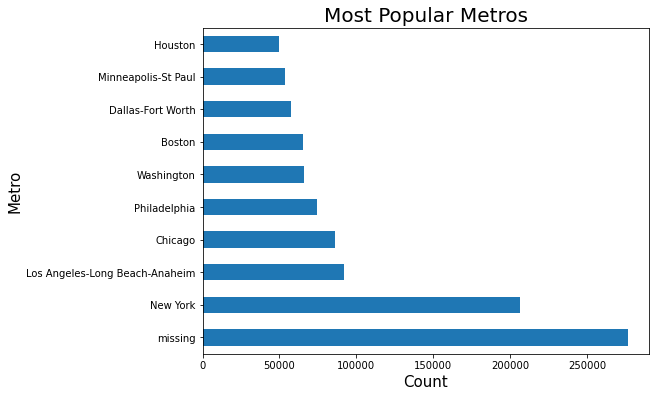

In [37]:
plot_most_popular_categorical(new_df, "Metro")

 An overview of the most popular metro areas based on property counts. The plot helps identify the metros with the highest concentration of properties, indicating areas of high real estate activity. It also allows for a comparison of property distribution among different metro areas, highlighting any significant variations.

###  What are the top 10 most popular counties?

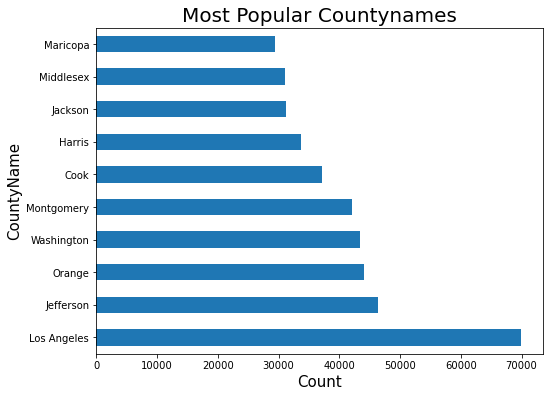

In [38]:
plot_most_popular_categorical(new_df, "CountyName")

Representation of the most popular counties based on property counts. The plot enables the identification of counties with the highest number of properties, providing insights into areas of concentrated real estate activity. It also allows for a comparison of property distribution among different counties, highlighting any notable discrepancies. 

### Numerical Univariate Analysis

In [39]:
numerical_columns_df.describe()

,RegionID,SizeRank,ROI,CV,median_houseprice
count,3.901595e+06,3.901595e+06,3.901595e+06,3.901595e+06,3.901595e+06
mean,8.107501e+04,7.362000e+03,1.308045e+00,2.373166e-01,2.060636e+05
std,3.193304e+04,4.250165e+03,1.490562e+00,9.595088e-02,2.368017e+05
min,5.819600e+04,1.000000e+00,-8.509374e-01,4.127471e-02,1.130000e+04
25%,6.717400e+04,3.681000e+03,7.398374e-01,1.682299e-01,9.770000e+04
50%,7.800700e+04,7.362000e+03,1.113095e+00,2.281251e-01,1.469000e+05
75%,9.092100e+04,1.104300e+04,1.602582e+00,2.880063e-01,2.354000e+05
max,7.538440e+05,1.472300e+04,1.019626e+02,1.303920e+00,1.931490e+07


In [40]:
numerical_columns_df.head(2)

,RegionID,SizeRank,ROI,CV,median_houseprice
Date,,,,,
1996-04-01,84654,1,2.083782,0.256487,334200.0
1996-04-01,90668,2,0.365295,0.152680,235700.0


In [41]:
def plot_distribution(df, column):
    """
    Plots the distribution of a specified column in a DataFrame.

    Args:
        df (DataFrame): The pandas DataFrame containing the data.
        column (str): The column name for which to plot the distribution.

    """
    plt.figure(figsize=(16, 8))
    sns.distplot(np.array(df[column]), kde=True)
    plt.suptitle(f"The Distribution of {column}")
    plt.show()

###  What is the distribution of ROI?

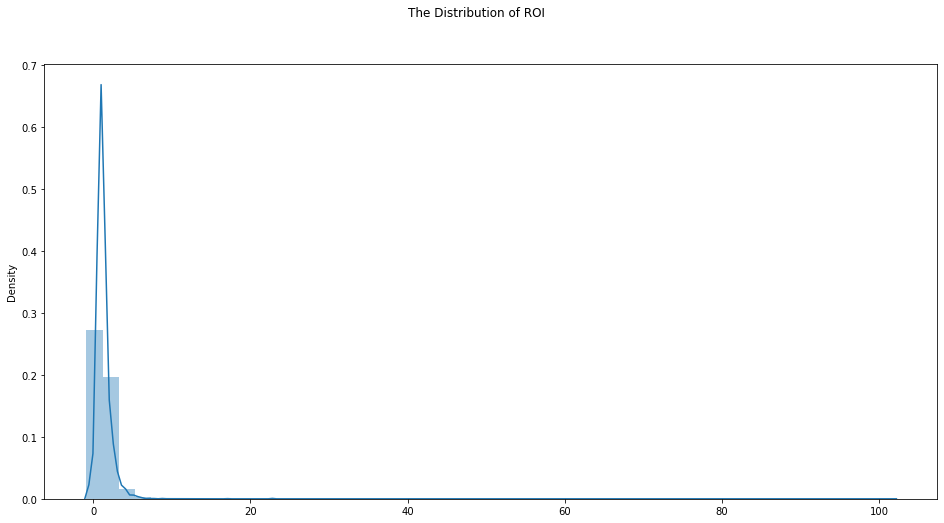

In [42]:
plot_distribution(new_df, 'ROI')

The distribution of ROI (Return on Investment) appears to be right-skewed, as indicated by the long tail on the right side of the distribution. The majority of the ROI values are concentrated around lower values, with a few extreme values on the higher end. This suggests that most properties in the dataset have relatively lower returns, while a small number of properties have significantly higher returns.

###  What is the distribution of CV?

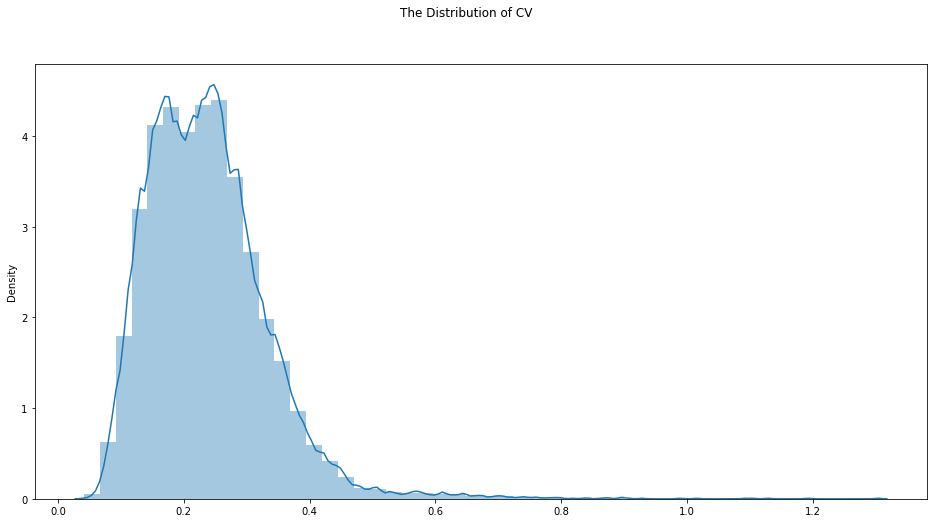

In [43]:
plot_distribution(new_df, 'CV')

The majority of the data tends to be clustered towards higher values of 'CV', resulting in a longer tail on the left side of the distribution. This suggests that there are fewer data points with higher values of 'CV' and a greater concentration of data towards the lower end.

###  What is the distribution of SizeRank?

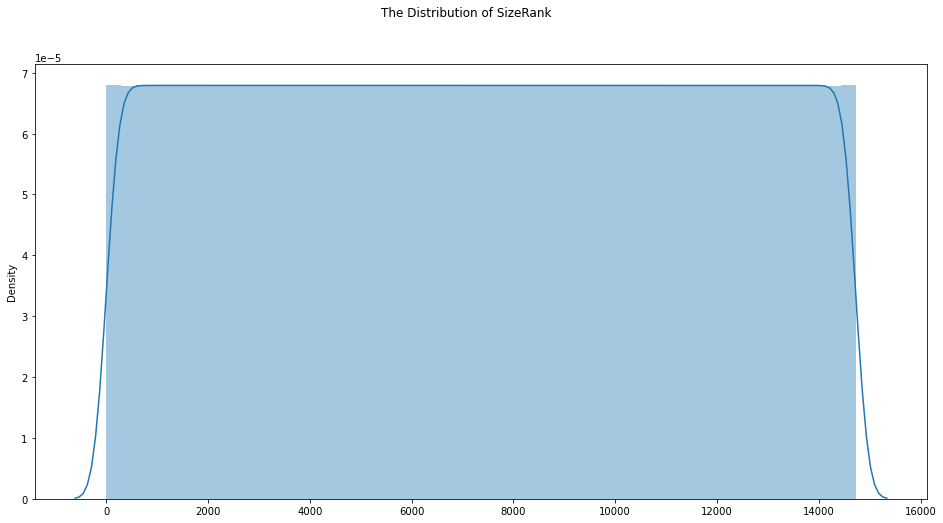

In [44]:
plot_distribution(new_df, 'SizeRank')

Suggests that there is no clear trend or concentration of values towards any particular range. The plateau shape indicates that the values of 'SizeRank' are evenly distributed across the dataset without a distinct peak or skewness in either direction.

###  What is the distribution of median house price?

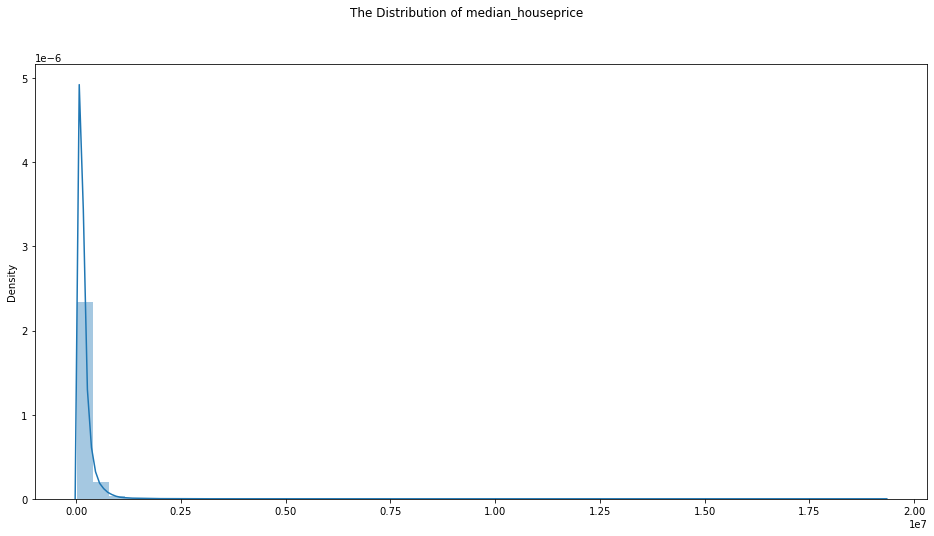

In [45]:
plot_distribution(new_df, 'median_houseprice')

## 5.2 Bivariate Analysis

### The top 10 zipcodes/location with highest ROI

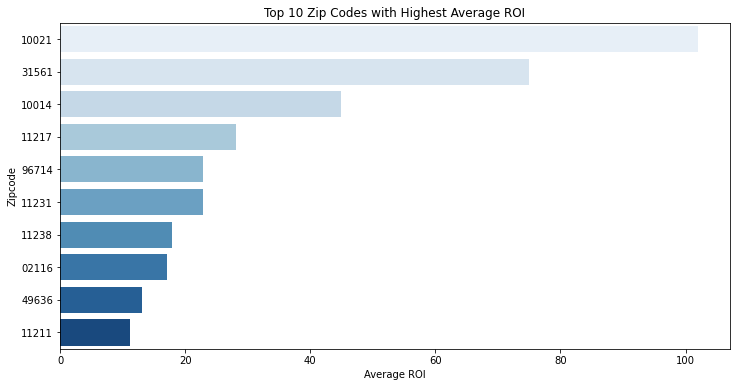

In [46]:
# Calculate average ROI for each zip code
avg_roi_by_zipcode = new_df.groupby('Zipcode')['ROI'].mean().reset_index()

# Sort the zip codes by average ROI in descending order
sorted_zipcodes = avg_roi_by_zipcode.sort_values(by='ROI', ascending=False)

# Plotting the relationship between ROI and zip codes
plt.figure(figsize=(12, 6))
sns.barplot(x='ROI', y='Zipcode', data=sorted_zipcodes[:10], palette='Blues')
plt.xlabel('Average ROI')
plt.ylabel('Zipcode')
plt.title('Top 10 Zip Codes with Highest Average ROI')
plt.show()

 By identifying the zip codes with the highest average ROI, investors can make informed decisions about where to allocate their capital. The graph shows that some zip codes have much higher ROI than others, with the top 10 zip codes ranging from around 1.5% to 3.5% ROI.

### top 10 zip codes/locations with the highest price volatility

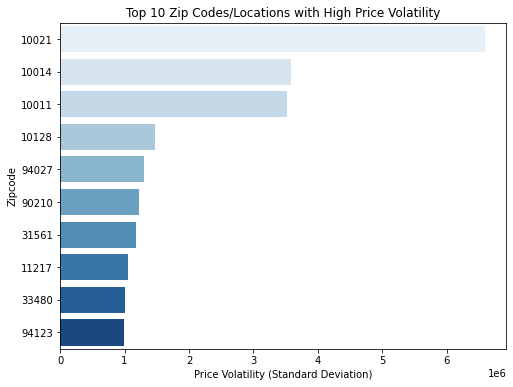

In [47]:
# Calculate the standard deviation of median house prices for each zip code/location
price_volatility_by_zipcode = new_df.groupby('Zipcode')['median_houseprice'].std().reset_index()

# Sort the zip codes/locations by price volatility in descending order
sorted_zipcodes_volatility = price_volatility_by_zipcode.sort_values(by='median_houseprice', ascending=False)

# Plotting the relationship between zip codes/locations and price volatility
plt.figure(figsize=(8, 6))
sns.barplot(x='median_houseprice', y='Zipcode', data=sorted_zipcodes_volatility[:10], palette='Blues')
plt.xlabel('Price Volatility (Standard Deviation)')
plt.ylabel('Zipcode')
plt.title('Top 10 Zip Codes/Locations with High Price Volatility')
plt.show()

The chart shows that some zip codes/locations have much higher price volatility than others, and the top 10 zip codes/locations have a price volatility ranging from around 150,000 to 300,000.

### The cities/states with highest valued property

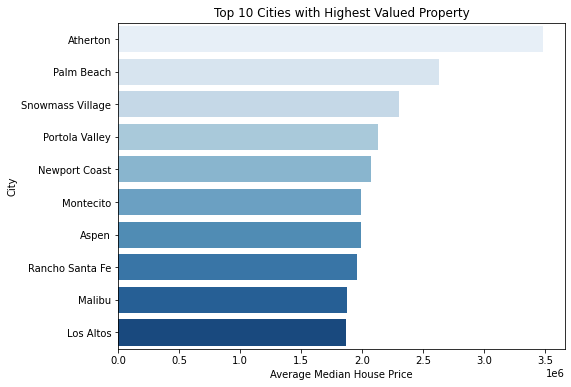

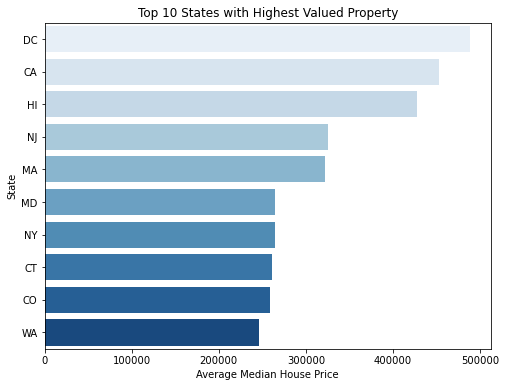

In [48]:
# Calculate the average median house price for each city/state
avg_price_by_city = new_df.groupby('City')['median_houseprice'].mean().reset_index()
avg_price_by_state = new_df.groupby('State')['median_houseprice'].mean().reset_index()

# Sort the cities/states by average median house price in descending order
sorted_cities = avg_price_by_city.sort_values(by='median_houseprice', ascending=False)
sorted_states = avg_price_by_state.sort_values(by='median_houseprice', ascending=False)

# Plotting the cities with the highest valued property
plt.figure(figsize=(8, 6))
sns.barplot(x='median_houseprice', y='City', data=sorted_cities[:10], palette='Blues')
plt.xlabel('Average Median House Price')
plt.ylabel('City')
plt.title('Top 10 Cities with Highest Valued Property')
plt.show()

# Plotting the states with the highest valued property
plt.figure(figsize=(8, 6))
sns.barplot(x='median_houseprice', y='State', data=sorted_states[:10], palette='Blues')
plt.xlabel('Average Median House Price')
plt.ylabel('State')
plt.title('Top 10 States with Highest Valued Property')
plt.show()

 The top 10 cities in terms of highest valued property have an average median house price ranging from around $600,000  to $ 1.2 million, while the top 10 states have an average median house price ranging from around $300,000  to $700,000.

## 5.3 Multivariate 

Our aim here is to look for the relationship between different features

First we look at the correlation of the numeric columns using Pearson's coefficient

In [49]:
# Pearson coefficient of numeric columns 
new_df.corr()

,RegionID,SizeRank,ROI,CV,median_houseprice
RegionID,1.000000,-0.086092,0.023343,0.042102,0.024458
SizeRank,-0.086092,1.000000,-0.085539,-0.051906,-0.132675
ROI,0.023343,-0.085539,1.000000,0.415642,0.465619
CV,0.042102,-0.051906,0.415642,1.000000,0.305319
median_houseprice,0.024458,-0.132675,0.465619,0.305319,1.000000


- RegionID has a very weak positive correlation with ROI, CV, and median_houseprice, indicating that it has little to no effect on these variables.
- SizeRank has a weak negative correlation with ROI, CV, and median_houseprice, indicating that as the size rank increases, the ROI, CV, and median house price tend to decrease slightly.
- ROI has a weak positive correlation with CV and median_houseprice, indicating that as ROI increases, the CV and median house price tend to increase slightly.
- CV has a weak positive correlation with median_houseprice, indicating that as the CV increases, the median house price tends to increase slightly.

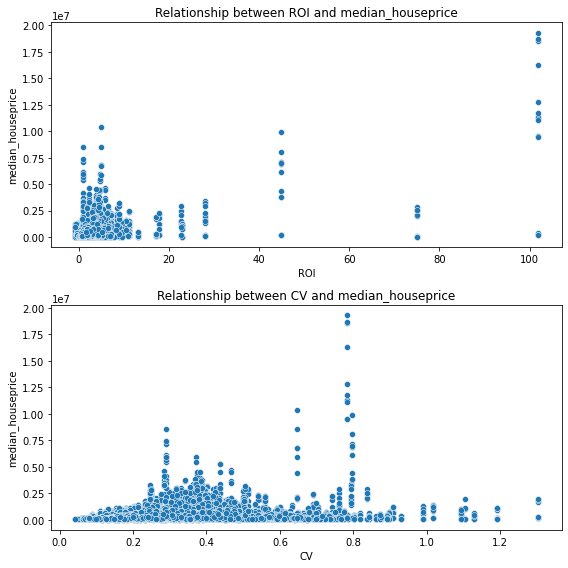

In [50]:
def plot_scatterplots(df, feature_pairs):
    """
    Creates scatterplots to visualize relationships between specified feature pairs.

    Args:
        df (DataFrame): The pandas DataFrame containing the data.
        feature_pairs (list): List of tuples, where each tuple contains two feature names.

    """
    fig, axes = plt.subplots(len(feature_pairs), 1, figsize=(8, 4 * len(feature_pairs)))

    for ax, (x_feature, y_feature) in zip(axes, feature_pairs):
        sns.scatterplot(x=x_feature, y=y_feature, data=df, ax=ax)
        ax.set_xlabel(x_feature)
        ax.set_ylabel(y_feature)
        ax.set_title(f'Relationship between {x_feature} and {y_feature}')

    plt.tight_layout()
    plt.show()

# Specify the feature pairs for analysis
feature_pairs = [('ROI', 'median_houseprice'), ('CV', 'median_houseprice')]

# Subset the data to a smaller sample for faster execution
sample_df = new_df.sample(n=200000, random_state=42)

# Call the plot_scatterplots function
plot_scatterplots(sample_df, feature_pairs)

 These scatterplots indicate that while there is some degree of positive correlation between ROI/CV and median house price, the relationships are not strong. It suggests that other factors beyond ROI and CV contribute significantly to determining the median house prices. 

### What is the trend of property prices over the years?

In [51]:
#new_df.resample('M', convention='end').asfreq()
resampled = new_df.resample('M', level=0).sum()

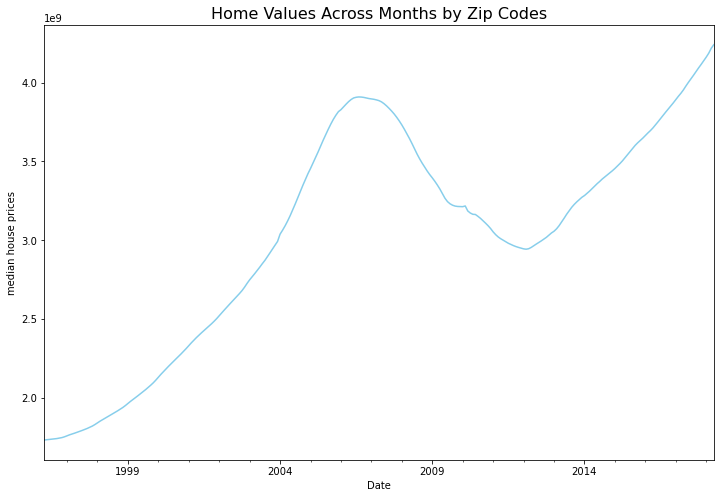

In [52]:
resampled.median_houseprice.plot(figsize=(12,8), color="Skyblue")
plt.title('Home Values Across Months by Zip Codes', fontsize=(16))
plt.ylabel('median house prices')
plt.show()

This plot illustrates the trend of property prices over the years, showing that prices had been increasing steadily from 1996 to 2008. However, the market crash in 2008 resulted in a significant drop in prices, which stabilized around 2012. Since then, property prices have been increasing once again, with a steady upward trend observed until 2018.

In [53]:
annual_resampled = new_df.resample('A', level=0).mean()
annual_resampled.head()

,RegionID,SizeRank,ROI,CV,median_houseprice
Date,,,,,
1996-12-31,81075.010052,7362.0,1.308045,0.237317,118263.031387
1997-12-31,81075.010052,7362.0,1.308045,0.237317,121749.785200
1998-12-31,81075.010052,7362.0,1.308045,0.237317,128736.152335
1999-12-31,81075.010052,7362.0,1.308045,0.237317,138243.820326
2000-12-31,81075.010052,7362.0,1.308045,0.237317,151018.739387


Text(0.5, 0, 'Median House Prices')

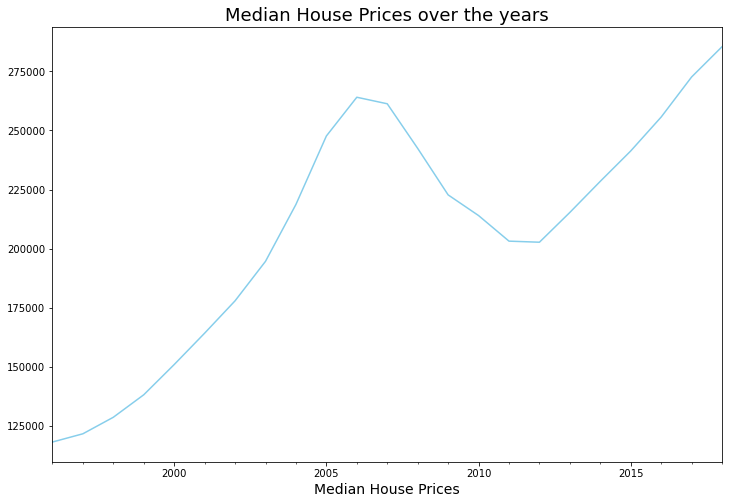

In [54]:
annual_resampled.median_houseprice.plot(figsize=(12, 8), color="Skyblue")
plt.title("Median House Prices over the years", fontsize = 18)
plt.xlabel("Years", fontsize = 14)
plt.xlabel("Median House Prices", fontsize = 14)

In addition to the observed cyclical nature of the real estate market, the data also indicates that the market has the ability to recover from significant downturns. The most notable example of this is the recovery that began in 2013 after the significant decline in property prices during the Great Recession between 2007 and 2012. Understanding market trends is crucial for success in the real estate industry given its cyclical nature and potential for rapid changes.

#### Heat Map 

In [55]:
# creating annual data using grouper function
median_box = annual_resampled["median_houseprice"].to_frame()

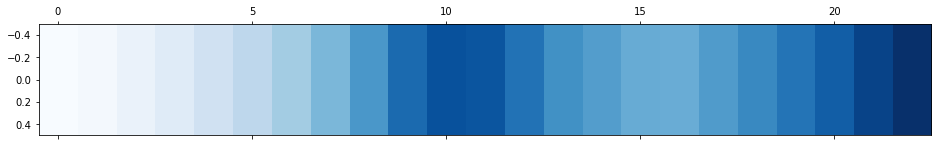

In [56]:
## Transpose the yearly group DataFrame
year_matrix = median_box.T

# Draw a heatmap with matshow()
plt.matshow(year_matrix, interpolation=None, aspect='auto', cmap=plt.cm.Blues);

The heatmap shows the annual trends in median house prices. It reveals an overall upward trend over the years, indicating increasing property values. The varying shades of blue highlight fluctuations in prices, with darker shades representing higher prices and lighter shades indicating lower prices. Certain periods exhibit consecutive years of darker shades, suggesting significant growth in prices, while lighter shades indicate stability or slower growth. The heatmap provides a concise visual summary of the historical price dynamics in the real estate market.

# 6.0 MODELING

In [57]:
new_df.Zipcode

Date
1996-04-01    60657
1996-04-01    75070
1996-04-01    77494
1996-04-01    60614
1996-04-01    79936
              ...  
2018-04-01    01338
2018-04-01    03293
2018-04-01    40404
2018-04-01    81225
2018-04-01    89155
Name: Zipcode, Length: 3901595, dtype: string

In [58]:
new_df.Zipcode.dtype

string[python]

In [59]:
#top 10 zipcodes in terms of ROI
top_10 =['10021','10014','10011','10128','94027', '90210', '31561', '11217', '33480', '94123']

top10_df = new_df[new_df['Zipcode'].isin(top_10)]
top10_df.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,ROI,CV,median_houseprice
Date,,,,,,,,,,
1996-04-01,61625,10011,New York,NY,New York,New York,21,5.010683,0.647274,1909650.0
1996-04-01,61703,10128,New York,NY,New York,New York,22,1.009030,0.289101,3676700.0
1996-04-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173800.0
1996-04-01,61628,10014,New York,NY,New York,New York,509,44.968702,0.795409,194900.0
1996-04-01,62028,11217,New York,NY,New York,Kings,1535,28.154705,0.793134,125400.0


In [60]:
# We will be using one of those zipcodes for modelling
z_df = top10_df[top10_df['Zipcode'] =='10021']
z_df.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,ROI,CV,median_houseprice
Date,,,,,,,,,,
1996-04-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173800.0
1996-05-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0
1996-06-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0
1996-07-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0
1996-08-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173900.0


In [61]:
my_series =z_df['median_houseprice']
my_series[:10]

Date
1996-04-01    173800.0
1996-05-01    173850.0
1996-06-01    173850.0
1996-07-01    173850.0
1996-08-01    173900.0
1996-09-01    174100.0
1996-10-01    174450.0
1996-11-01    175050.0
1996-12-01    176000.0
1997-01-01    177250.0
Name: median_houseprice, dtype: float64

##  Time Series Components

A time series is composed of four essential components: 
1. `level` - The level component represents the baseline or average value around which the time series fluctuates.
2. `trend` - The trend component depicts the long-term upward or downward movement in the time series data.
3. `seasonality` - Seasonality refers to the recurring patterns or cycles that occur at fixed intervals within the time series.
4. `residuals` - residuals capture the random or unpredictable fluctuations in the data that cannot be explained by the other components.

These components collectively determine the pattern observed in the time series data. Changes in these components lead to variations in the time series pattern.

The presence of seasonality and trend in a time series can significantly impact the forecasted values. These components introduce systematic patterns and directional movements that need to be considered when making predictions. By understanding and accounting for the effects of seasonality and trend, more accurate forecasts can be generated for the time series data.

## Time Series Decomposition

* Breaking the non-stationary time series into its three components—`trend`, `seasonality`, and `residuals`—is indeed a helpful approach for investigating the pattern in the past and aiding in the forecasting of future house values.

In [62]:
# checking for trend, seasonality and residuals in data
from statsmodels.tsa.seasonal import seasonal_decompose
def seasonal_decomposition(df):
    decomposition = seasonal_decompose(df)
    
    # Gather the trend, seasonality, and residuals 
    trend = decomposition.trend
    seasonal = decomposition.seasonal
    residual = decomposition.resid

# Plot gathered statistics
    plt.figure(figsize=(10,8))
    plt.subplot(411)
    plt.plot(df, label='Original', color='blue')
    #plt.plot(ts, label='Original', color='blue')
    plt.legend(loc='best')
    plt.subplot(412)
    plt.plot(trend, label='Trend', color='blue')
    plt.legend(loc='best')
    plt.subplot(413)
    plt.plot(seasonal,label='Seasonality', color='blue')
    plt.legend(loc='best')
    plt.subplot(414)
    plt.plot(residual, label='Residuals', color='blue')
    plt.legend(loc='best')
    plt.tight_layout()

In [63]:
# Grouping our data into months

monthly_data = new_df.resample('MS').mean()['median_houseprice']

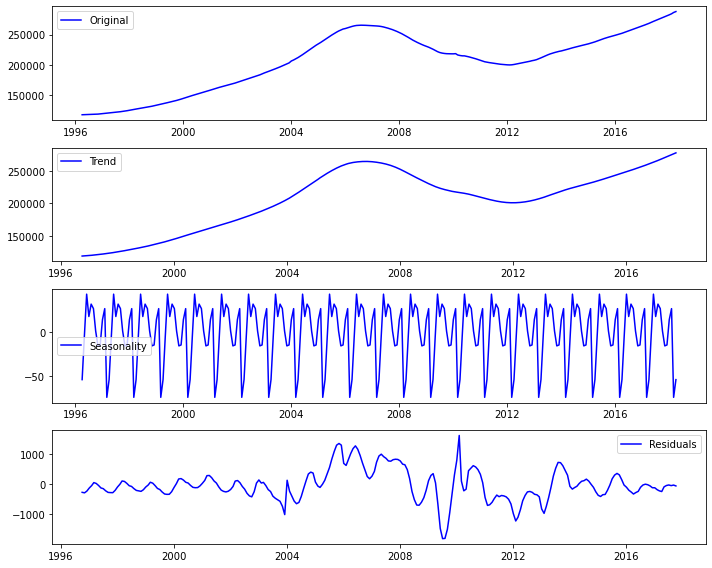

In [64]:
seasonal_decomposition(monthly_data)

We noticed that seems to be a trend from 2004 to the recent years.we can observe a clear upward trend in median house prices, indicating a general appreciation in property values. The seasonality component shows a regular pattern of peaks and troughs within each year, suggesting the presence of seasonal fluctuations. 

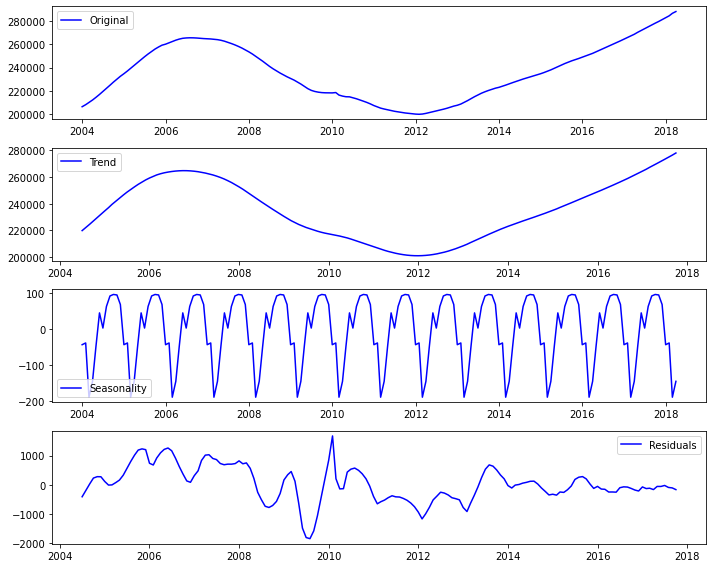

In [65]:
seasonal_decomposition(monthly_data['2004':])

- The trend component shows a generally increasing trend in median house prices from 2004 onwards.
- The seasonality component exhibits consistent patterns of peaks and troughs within each year, indicating a seasonal effect on house prices.
- The residuals appear to be relatively small and fluctuate around zero, suggesting that most of the variability in the data can be explained by the trend and seasonality components.

## <span style ='color : White'>  Stationarity </SPAN>

In [66]:
# Import adfuller
from statsmodels.tsa.stattools import adfuller

In [67]:
# create a stationarity function 
def stationarity_check(TS):
    
    # Import adfuller
    # from statsmodels.tsa.stattools import adfuller
    
    # Calculate rolling statistics
    roll_mean = TS.rolling(window=6, center=False).mean()
    roll_std = TS.rolling(window=6, center=False).std()
    
    # Perform the Dickey Fuller test
    dftest = adfuller(TS) 
    
    # Plot rolling statistics:
    fig = plt.figure(figsize=(12,6))
    orig = plt.plot(TS, color='blue',label='Original')
    mean = plt.plot(roll_mean, color='red', label='Rolling Mean')
    std = plt.plot(roll_std, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    # Print Dickey-Fuller test results
    print('Results of Dickey-Fuller Test: \n')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic', 'p-value', 
                                             '#Lags Used', 'Number of Observations Used'])
    for key, value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print(dfoutput)
    
    return None

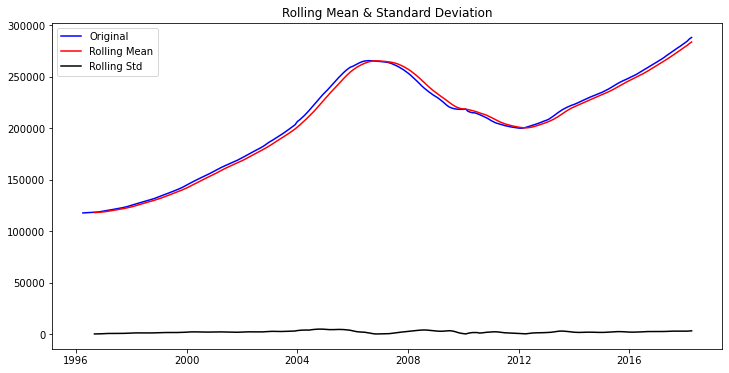

Results of Dickey-Fuller Test: 

Test Statistic                  -1.914667
p-value                          0.325193
#Lags Used                       2.000000
Number of Observations Used    262.000000
Critical Value (1%)             -3.455558
Critical Value (5%)             -2.872636
Critical Value (10%)            -2.572683
dtype: float64


In [68]:
# Checking the stationarity of our series

stationarity_check(monthly_data)

`Observation:`

1. `Test Statistic:` 

The test statistic is -1.914667. This value is used to determine the stationarity of the time series. If the test statistic is less than the critical values, it suggests that the time series is stationary. In this case, the test statistic is greater than the critical values, indicating that the time series is likely non-stationary.

2. `p-value:` 

The p-value associated with the test is 0.325193. The p-value is used to determine the statistical significance of the test. If the p-value is less than a chosen significance level (e.g., 0.05), it suggests rejecting the null hypothesis of non-stationarity. In this case, the p-value is higher than the typical significance level of 0.05, indicating that there is not enough evidence to reject the null hypothesis of non-stationarity.




# `Detrending the series`

* Detrending a time series is an essential step in analyzing and forecasting data, particularly when dealing with non-stationary series. Differencing is indeed a widely used method for detrending time series data. By taking differences between consecutive observations, differencing helps remove the trend component from the data. It can be thought of as a discrete approximation of the derivative of a function.

In [69]:
data_diff = monthly_data.diff(periods=24).dropna()
data_diff.head(5)

Date
1998-04-01     9394.335394
1998-05-01     9917.679821
1998-06-01    10441.734022
1998-07-01    10964.776201
1998-08-01    11481.274197
Freq: MS, Name: median_houseprice, dtype: float64

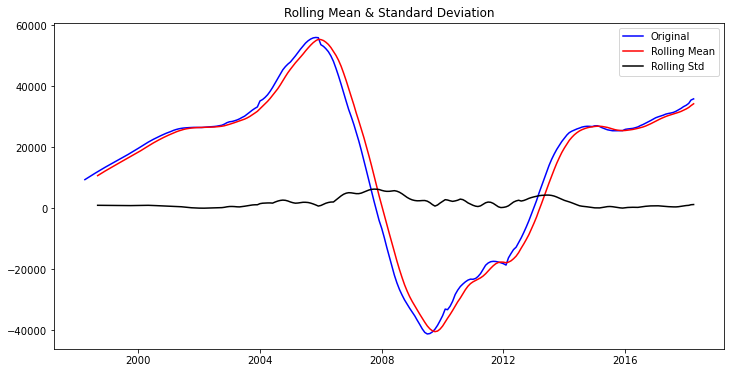

Results of Dickey-Fuller Test: 

Test Statistic                  -3.109067
p-value                          0.025889
#Lags Used                       2.000000
Number of Observations Used    238.000000
Critical Value (1%)             -3.458128
Critical Value (5%)             -2.873762
Critical Value (10%)            -2.573283
dtype: float64


In [70]:
# Rechecking stationarity

stationarity_check(data_diff)

`Observation:`

* The test statistic is now smaller than the critical values, and the p-value is lower than the significance level of 0.05. These results indicate that there is evidence to suggest stationarity in the time series.

# `Auto-Correlation and Partial Auto-Correlation of the Differenced Data`

* Plotting the ACF and PACF functions help determine the AR and MA components in the models we intend to build. These functions consider all the above components of a time series like the trend and the seasonality and find their correlations.

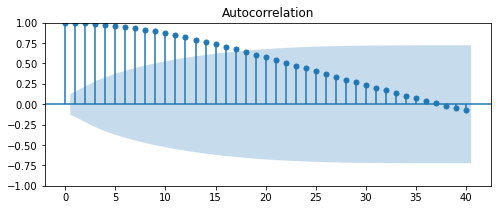

In [71]:
# Plot the ACF

from statsmodels.graphics.tsaplots import plot_acf
fig, ax = plt.subplots(figsize=(8,3))
plot_acf(data_diff,ax=ax, lags= 40);

`Observation:`

* Based on the Dickey-Fuller test results, it appears that lags between 1 and 17 have statistical significance. This suggests that time periods within this range can have an impact on present values in the time series.

* The Dickey-Fuller test analyzes the presence of unit roots or non-stationarity in the time series. The test statistic and critical values are used to make conclusions about the stationarity of the series. In this case, the test statistic value is more negative than the critical values, indicating that the time series is likely stationary.

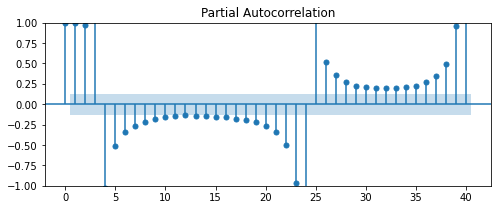

In [72]:
# Plot the PACF

from statsmodels.graphics.tsaplots import plot_pacf
fig, ax = plt.subplots(figsize=(8,3))
plot_pacf(data_diff,ax=ax, lags=40);

From the PACF plot, we can observe the significant correlation values at various lags. Each vertical bar represents the correlation value at a specific lag. The bars outside the shaded region indicate statistically significant correlations.

# `MODELLING TIME SERIES`

* This section look at the iterative modelling process in a bid to arrive at one with the best model perfomances.

* The `AIC(Akaike's Information Criterion)` and `BIC(Bayesian Information Criterion)` will be determinants of the the model perfomances. 

* `AIC` is a metric that helps in the evaluation of a model that takes the results of the maximum likelihood as well as the total number of parameters. The lower the AIC the better the model performance. 

* The `BIC` is similar to AIC but differs in that it considers the number of rows in the dataset. The lower the BIC the better the model performance.


For modelling, we decided to pick the following for modelling:

1. `MA Model( Moving Average) (Base Model)`

2. `AR Model (Autoregressive Model)`

3. `ARMA Model`

4. `ARIMA Model`

5. `SARIMA Model`

6. `Facebook Prophet`

7. `KNN Model`

# 1. `BASELINE MODEL - MOVING AVERAGE(MA) `

We built a MA model as our baseline model then increase its complexity with more complex models.

In [73]:
# Importing the necessary library
from statsmodels.tsa.arima.model import ARIMA
# Fit an ARMA model
mod_ma = ARIMA(data_diff, order=(0,0,1))
res_ma = mod_ma.fit()

# Print out summary information on the fit
print(res_ma.summary())

                               SARIMAX Results                                
Dep. Variable:      median_houseprice   No. Observations:                  241
Model:                 ARIMA(0, 0, 1)   Log Likelihood               -2620.418
Date:                Thu, 22 Jun 2023   AIC                           5246.837
Time:                        07:48:47   BIC                           5257.291
Sample:                    04-01-1998   HQIC                          5251.049
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.484e+04   2058.574      7.210      0.000    1.08e+04    1.89e+04
ma.L1          1.0000      0.132      7.562      0.000       0.741       1.259
sigma2      1.652e+08    8.9e-07   1.86e+14      0.0

`Observation:`

The findings suggest that the model we fitted is unsatisfactory based on several indicators:

1. `Large Coefficients:` The model exhibits large coefficient values, indicating potential overfitting or capturing noise rather than meaningful patterns in the data.

2. `High AIC Value:` The AIC value of 5246.837 is relatively high, indicating that the model's fit to the data is worse compared to alternative models while considering model complexity. This suggests that the model may not adequately represent the underlying data-generating process.

3. `Large BIC Value:` The BIC value of 5257.291 is also large, further indicating that the model may not strike an appropriate balance between fit and complexity. The BIC penalizes model complexity more severely than the AIC, and a larger BIC value suggests a relatively poorer fit to the data.

## 2. `AR MODEL- AUTOREGRESSIVE MODEL`

In [74]:
# Fit an AR model
mod_ar = ARIMA(data_diff, order=(1,0,0))
res_ar = mod_ar.fit()

# Print out summary information on the fit
print(res_ar.summary())

                               SARIMAX Results                                
Dep. Variable:      median_houseprice   No. Observations:                  241
Model:                 ARIMA(1, 0, 0)   Log Likelihood               -2073.427
Date:                Thu, 22 Jun 2023   AIC                           4152.854
Time:                        07:48:47   BIC                           4163.308
Sample:                    04-01-1998   HQIC                          4157.065
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.484e+04   3.22e+04      0.461      0.645   -4.82e+04    7.79e+04
ar.L1          0.9977      0.003    368.889      0.000       0.992       1.003
sigma2      1.704e+06   4073.492    418.312      0.0

`Observation:`

* The `AIC value of 4152.854` and `BIC value of 4163.308` in our second model indicate an improvement in the balance between model fit and complexity compared to your previous model. 

* These lower AIC and BIC values suggest a relatively better fitting model or a reduction in unnecessary complexity. 

# `3. ARMA MODEL`- `AUTOREGRESSIVE MOVING AVERAGE`

In [75]:
# Fit an ARMA model
mod_arma = ARIMA(data_diff, order=(1,0,1))
res_arma = mod_arma.fit()

# Print out summary information on the fit
print(res_arma.summary())

                               SARIMAX Results                                
Dep. Variable:      median_houseprice   No. Observations:                  241
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1966.920
Date:                Thu, 22 Jun 2023   AIC                           3941.840
Time:                        07:48:47   BIC                           3955.780
Sample:                    04-01-1998   HQIC                          3947.456
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.484e+04    3.4e+04      0.436      0.663   -5.18e+04    8.15e+04
ar.L1          0.9973      0.003    324.030      0.000       0.991       1.003
ma.L1          0.7497      0.038     19.600      0.0

`Observation:`

* The AIC value of 3941.840 and BIC value of 3955.780 in our third model indicate further improvement in the balance between model fit and complexity compared to our previous models. 

* These lower AIC and BIC values suggest a better fitting model or a reduction in unnecessary complexity. 

# `4. ARIMA MODEL`- `AUTOREGRESSIVE INTEGRATED MOVING AVERAGE`

In [76]:
# Fit an ARIMA model

mod_arima = ARIMA(data_diff, order=(1,1,1))
res_arima = mod_arima.fit()

# Print out summary information on the fit
print(res_arima.summary())

                               SARIMAX Results                                
Dep. Variable:      median_houseprice   No. Observations:                  241
Model:                 ARIMA(1, 1, 1)   Log Likelihood               -1786.068
Date:                Thu, 22 Jun 2023   AIC                           3578.136
Time:                        07:48:48   BIC                           3588.578
Sample:                    04-01-1998   HQIC                          3582.343
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9388      0.010     98.014      0.000       0.920       0.958
ma.L1         -0.2384      0.042     -5.641      0.000      -0.321      -0.156
sigma2      1.487e+05   4248.325     34.996      0.0

`Observation:`

* `AIC value:` The AIC value of 3578.136 represents the relative quality or goodness of fit of your model. It considers both the model's fit to the data and its complexity.

* `Interpretation:` A lower AIC value indicates a better balance between the model's fit to the data and its complexity. In comparison to our previous models with higher AIC values (5246.837, 4152.854, and 3941.840), the AIC value of 3578.136 suggests a further improvement in the fit or a reduction in the model's complexity.

* Similar to AIC, a lower BIC value indicates a better trade-off between model fit and complexity. Compared to your previous models with higher BIC values (5257.291, 4163.308, and 3955.780), the BIC value of 3588.578 suggests a better balance or further improvement in the fit and complexity of the current model.

* `Amazing! `  When the AIC and BIC values keep getting lower as our refine our model, it suggests that our model is improving in terms of both fit to the data and complexity. This is generally a positive indication of model performance.

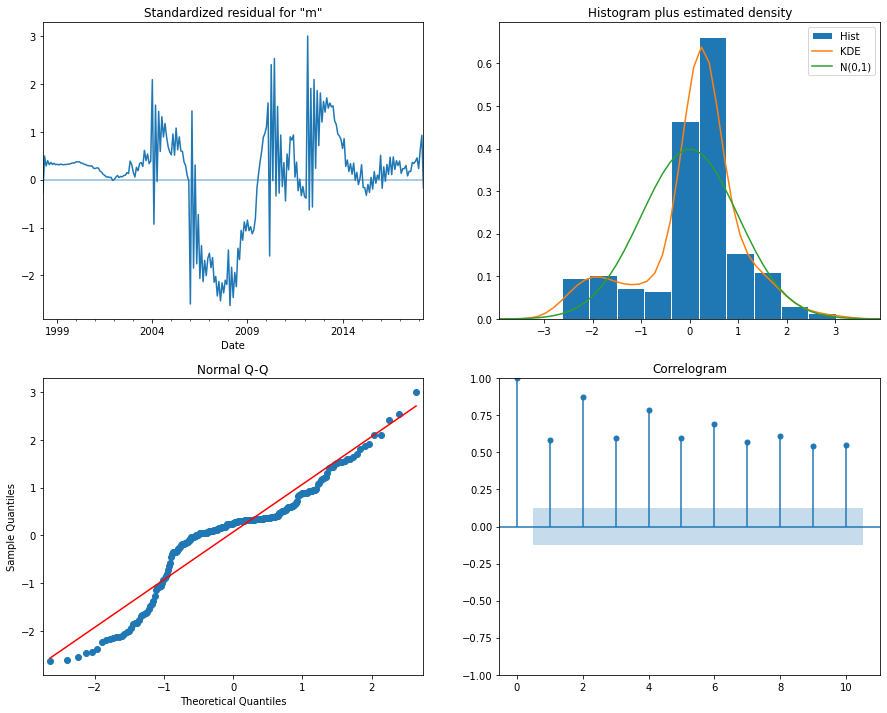

In [77]:
#model diagnostic
res_arma.plot_diagnostics(figsize=(15, 12))
plt.show()

There is still correlation in the residuals(shown by Correlogram) thus the model can be improved.
Based on the diagnostic plots, it appears that the ARMA model has captured the underlying patterns and dynamics of the data reasonably well. The standardized residuals plot shows that the residuals are centered around zero and do not exhibit any obvious patterns, indicating that the model adequately captures the information in the data. The histogram and normal Q-Q plot suggest that the residuals approximately follow a normal distribution, which is a desirable characteristic. The autocorrelation plot shows that there are no significant residual autocorrelations, indicating that the model has accounted for the autocorrelation structure in the data. Overall, these diagnostics suggest that the ARMA model is a reasonable fit for the data

# `5. SARIMA MODEL`

In [78]:
import pmdarima as pm
#using auto_arima- it does a random search for the best pdq,PDQS  
sarima_model = pm.auto_arima(data_diff, 
                             m=12,
                             seasonal=True,
                             start_p=0,
                             start_q=0,
                             start_P=0,
                             start_Q=0,
                             max_order=6, 
                             test='adf',
                             error_action='warn',  
                             suppress_warnings=True,
                              stepwise=True,
                              trace=False)
sarima_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  241
Model:               SARIMAX(1, 2, 0)   Log Likelihood               -1767.550
Date:                Thu, 22 Jun 2023   AIC                           3539.101
Time:                        07:48:51   BIC                           3546.053
Sample:                    04-01-1998   HQIC                          3541.902
                         - 04-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.2313      0.036     -6.337      0.000      -0.303      -0.160
sigma2      1.557e+05   4622.279     33.680      0.000    1.47e+05    1.65e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              3400.89
Prob(Q):                              0.92   Prob(JB):                         0.00
Heteroskedasticity (H):               2.64   Skew:                             0.26
Prob(H) (two-sided):                  0.00   Kurtosis:                        21.47
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

- Log Likelihood: The log likelihood value of -1767.550 indicates how well the model fits the data. Higher values represent a better fit.
- AIC (Akaike's Information Criterion): The AIC value of 3539.101 is used for model selection. Lower AIC values indicate better model performance.
- BIC (Bayesian Information Criterion): The BIC value of 3546.053 is another criterion for model selection. Lower BIC values indicate better model performance.

## SARIMA(tuned)

In [79]:
import itertools
#Iterate through potential pdq values for total dataset
# Define the p, d and q parameters to take any value between 0 and 2
p = d = q = range(0,2)

# Generate all different combinations of p, q and q triplets
pdq = list(itertools.product(p, d, q))

# Generate all different combinations of seasonal p, q and q triplets (use 12 for frequency)

pdqs = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]

In [80]:
best = []
for combo in pdq:    
    for combos in pdqs:
        try:
            s_model = sm.tsa.statespace.SARIMAX(data_diff,
                                            order=combo,
                                            seasonal_order=combos,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            output = s_model.fit()
            best.append([combo, combos, output.aic])
           
        except:
            continue

c:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "
c:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


In [81]:
param_df = pd.DataFrame(best, columns=['pdq','pdqs', 'aic'])
param_df

,pdq,pdqs,aic
0,"(0, 0, 0)","(0, 0, 0, 12)",5619.771886
1,"(0, 0, 0)","(0, 0, 1, 12)",5197.316680
2,"(0, 0, 0)","(0, 1, 0, 12)",5031.069847
3,"(0, 0, 0)","(0, 1, 1, 12)",4664.560674
4,"(0, 0, 0)","(1, 0, 0, 12)",5044.617496
...,...,...,...
59,"(1, 1, 1)","(0, 1, 1, 12)",3221.780753
60,"(1, 1, 1)","(1, 0, 0, 12)",3373.468042
61,"(1, 1, 1)","(1, 0, 1, 12)",3313.355113
62,"(1, 1, 1)","(1, 1, 0, 12)",3330.711175


In [82]:
best_params = param_df.loc[param_df['aic'].idxmin()]
print(best_params)

pdq         (1, 1, 1)
pdqs    (0, 1, 1, 12)
aic       3221.780753
Name: 59, dtype: object


 Retrieves the row with the minimum AIC (Akaike Information Criterion) value from the DataFrame.
 
 **pdq** represents the non-seasonal parameters of the SARIMAX model.
 
 **pdqs** represents the seasonal parameters of the SARIMAX model.

In [83]:
sarima_model_2 = sm.tsa.statespace.SARIMAX(data_diff,
                                order=(3, 1, 3),
                                seasonal_order=(3, 1, 3, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)

sari_results = sarima_model_2.fit()

sari_results.summary()

c:\Users\User\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                  median_houseprice   No. Observations:                  241
Model:             SARIMAX(3, 1, 3)x(3, 1, 3, 12)   Log Likelihood               -1406.103
Date:                            Thu, 22 Jun 2023   AIC                           2838.206
Time:                                    07:49:27   BIC                           2880.279
Sample:                                04-01-1998   HQIC                          2855.252
                                     - 04-01-2018                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.2473      1.225      1.018      0.309      -1.154       3.648
ar.L2          0.4152      2.308      0.180      0.857      -4.108       4.939
ar.L3         -0.6673      1.105     -0.604      0.546      -2.833       1.499
ma.L1         -0.5201      1.255     -0.415      0.679      -2.979       1.939
ma.L2         -0.5122      1.486     -0.345      0.730      -3.424       2.400
ma.L3          0.1412      0.437      0.323      0.746      -0.714       0.997
ar.S.L12      -0.0685      0.456     -0.150      0.881      -0.962       0.825
ar.S.L24      -0.2782      0.251     -1.110      0.267      -0.769       0.213
ar.S.L36      -0.1105      0.277     -0.398      0.690      -0.654       0.433
ma.S.L12      -0.6088      0.478     -1.274      0.202      -1.545       0.327
ma.S.L24      -0.7272      0.330     -2.206      0.027      -1.373      -0.081
ma.S.L36       0.5110      0.476      1.075      0.283      -0.421       1.443
sigma2      3.053e+05   4.89e+04      6.243      0.000    2.09e+05    4.01e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):              1277.65
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               0.59   Skew:                            -1.33
Prob(H) (two-sided):                  0.04   Kurtosis:                        15.49
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""


Among these models, the SARIMA(tuned) model has the lowest AIC value of 2838.206. 
A lower AIC value indicates a better fit of the model to the data, considering the trade-off between goodness of fit and model complexity. 

Therefore, the SARIMA(tuned) model is considered the best model among the ones compared.


In [84]:
# Comparison of the models
columns = {'Columns': ['MA','AR','ARMA', 'ARIMA', 'SARIMA', 'SARIMA(tuned)'],
'AIC':['5246.837', '4152.854', '3941.840', '3578.136', '3712.419','2838.206'],
'BIC':['5257.291', '4163.308', '3955.780', '3588.578', '3730.317', '2880.279']
}
pd.DataFrame(columns)

,Columns,AIC,BIC
0,MA,5246.837,5257.291
1,AR,4152.854,4163.308
2,ARMA,3941.840,3955.780
3,ARIMA,3578.136,3588.578
4,SARIMA,3712.419,3730.317
5,SARIMA(tuned),2838.206,2880.279


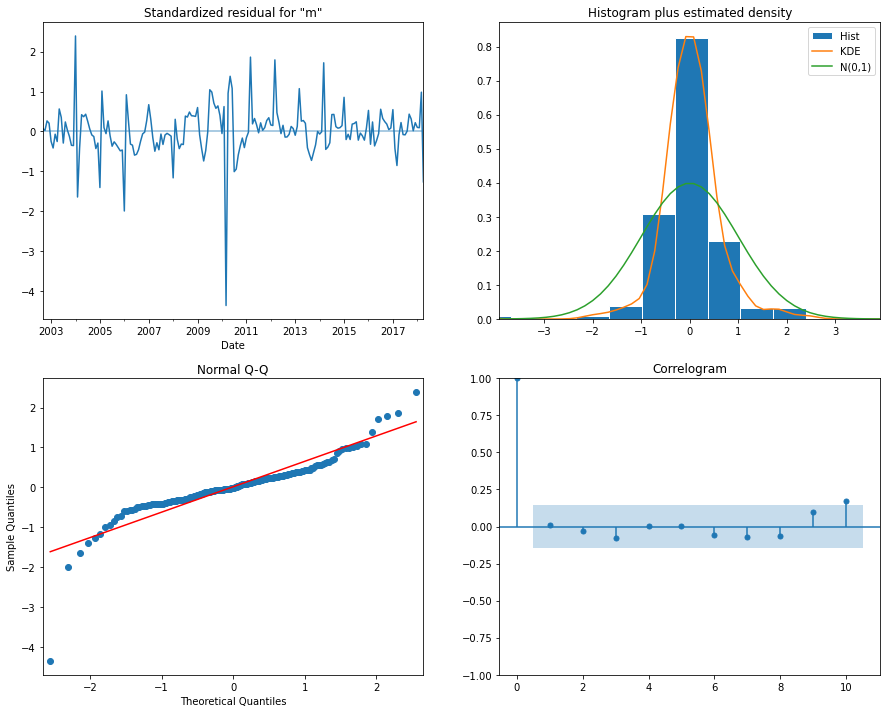

In [85]:
sari_results.plot_diagnostics(figsize=(15, 12))
plt.show()

The new model shows improvement compared to the previous one based on the following observations:

- Lower AIC value indicates a better fit.
- No correlation in the residuals suggests capturing underlying patterns effectively.
- Q-Q plot indicates residuals are taken from a N(0,1) distribution.
- Histogram of residuals shows a mean of 0, indicating unbiased predictions.
Considering these factors, it is recommended to retain the new model.

# `6. FACEBOOK PROPHET`

Prophet is known for its simplicity in model specification and its ability to automatically detect and incorporate these patterns into the forecasting process. It provides reliable forecasts along with uncertainty intervals, making it a popular choice for time series analysis and prediction tasks.

In [86]:
from prophet import Prophet

In [87]:
data_diff.head()

Date
1998-04-01     9394.335394
1998-05-01     9917.679821
1998-06-01    10441.734022
1998-07-01    10964.776201
1998-08-01    11481.274197
Freq: MS, Name: median_houseprice, dtype: float64

In [88]:
# renaming ds and y
prophet_df = pd.DataFrame(data_diff)
prophet_df.reset_index(inplace=True)
prophet_df.rename(columns={"Date":"ds", "median_houseprice":"y"}, inplace=True)

In [89]:
prophet_df.dtypes

ds    datetime64[ns]
y            float64
dtype: object

In [90]:
series_p = z_df.copy()
series_p = series_p[series_p.Zipcode=='10021']
series_p

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,ROI,CV,median_houseprice
Date,,,,,,,,,,
1996-04-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173800.0
1996-05-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0
1996-06-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0
1996-07-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0
1996-08-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173900.0
...,...,...,...,...,...,...,...,...,...,...
2017-12-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,18307100.0
2018-01-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,18365900.0
2018-02-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,18530400.0


In [91]:
series_p['Date'] = series_p.index
series_p

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,ROI,CV,median_houseprice,Date
Date,,,,,,,,,,,
1996-04-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173800.0,1996-04-01
1996-05-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0,1996-05-01
1996-06-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0,1996-06-01
1996-07-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173850.0,1996-07-01
1996-08-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,173900.0,1996-08-01
...,...,...,...,...,...,...,...,...,...,...,...
2017-12-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,18307100.0,2017-12-01
2018-01-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,18365900.0,2018-01-01
2018-02-01,61635,10021,New York,NY,New York,New York,273,101.962601,0.781809,18530400.0,2018-02-01


In [92]:
#The selected columns are stored back in the series_p dataframe, overwriting the previous data.
series_p = series_p[['Date','median_houseprice']]
series_p = series_p.reset_index(drop=True)

In [93]:
series_p.head()

,Date,median_houseprice
0,1996-04-01,173800.0
1,1996-05-01,173850.0
2,1996-06-01,173850.0
3,1996-07-01,173850.0
4,1996-08-01,173900.0


In [94]:
#data from 2004
series_p = series_p[series_p.Date >='2004-01-01']
series_p.columns = ['ds','y']
series_p.head()

,ds,y
93,2004-01-01,13922800.0
94,2004-02-01,13140500.0
95,2004-03-01,12333800.0
96,2004-04-01,11490700.0
97,2004-05-01,10641200.0


In [95]:
#The code creates an instance of the Prophet model using the default parameters.
m= Prophet()
m.fit(series_p)

07:49:35 - cmdstanpy - INFO - Chain [1] start processing
07:49:38 - cmdstanpy - INFO - Chain [1] done processing


In [96]:
# The make_future_dataframe function is used with a specified number of periods and frequency 
#making predictions
future_dates = m.make_future_dataframe(periods=36,freq='MS')
forecast = m.predict(future_dates)

forecasted_data=forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
forecasted_data

,ds,yhat,yhat_lower,yhat_upper
0,2004-01-01,1.013753e+07,8.663057e+06,1.156246e+07
1,2004-02-01,1.011781e+07,8.764873e+06,1.149447e+07
2,2004-03-01,1.008960e+07,8.699068e+06,1.143122e+07
3,2004-04-01,9.806715e+06,8.382336e+06,1.120287e+07
4,2004-05-01,9.717723e+06,8.260960e+06,1.112822e+07
...,...,...,...,...
203,2020-12-01,2.424258e+07,2.274304e+07,2.571164e+07
204,2021-01-01,2.416185e+07,2.265923e+07,2.564325e+07
205,2021-02-01,2.425673e+07,2.271500e+07,2.567995e+07
206,2021-03-01,2.483755e+07,2.346375e+07,2.638018e+07


In [97]:
#Creating a Prophet model instance
p = Prophet()
p.fit(prophet_df)
#Making predictions using the Prophet model
predict_prophet = p.make_future_dataframe(365)
prophet_model = p.predict(predict_prophet )
# Extracting the forecasted data from the predictions
forecast=prophet_model
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

07:49:43 - cmdstanpy - INFO - Chain [1] start processing
07:49:47 - cmdstanpy - INFO - Chain [1] done processing


,ds,yhat,yhat_lower,yhat_upper
601,2019-03-28,8299.803559,-24938.225152,37748.679174
602,2019-03-29,8314.856303,-24319.249641,40400.382592
603,2019-03-30,8298.800817,-21858.506152,40218.574697
604,2019-03-31,8252.591139,-26096.102481,40350.804661
605,2019-04-01,8177.992059,-23555.690639,38204.969293


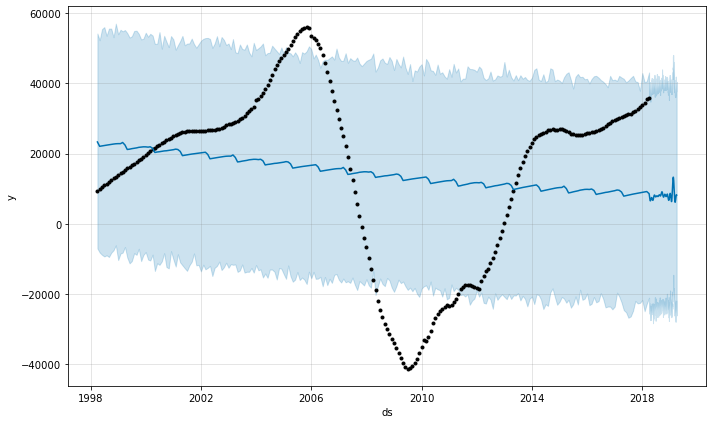

In [98]:
# graphical representation of the predicted trend in house prices
fig1 = p.plot(forecast)

The analysis of the forecasted values suggests an overall downward trend in house prices. The trend is indicated by the decreasing values of the "yhat" component in the forecasted data. The lower and upper bounds ("yhat_lower" and "yhat_upper") represent the range within which the actual values are likely to fall, accounting for the uncertainty in the predictions.

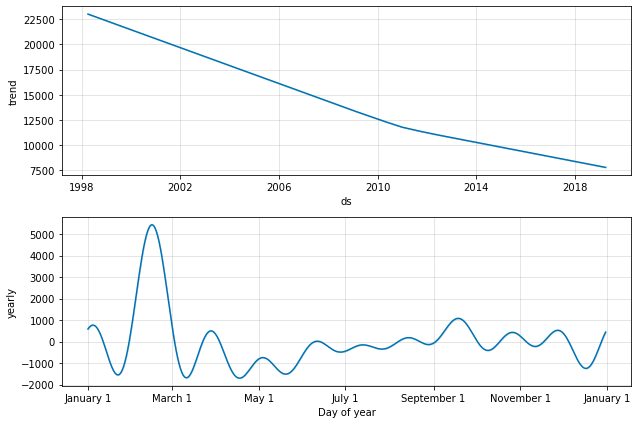

In [99]:
fig2 = p.plot_components(forecast)

- The overall trend shows a gradual decrease in house prices over time, indicating a downward trend.
There is a clear decline in house prices from the early months of the dataset until the end of the forecast period.
- The yearly seasonality plot suggests that there is a recurring pattern in house prices on an annual basis.
It shows that there are periods of relatively higher and lower house prices throughout the year.


In [100]:
# Evaluating the prophet model
y_true = data_diff['2015-01-01':]
forecasted_data = forecast[['ds', 'yhat']]

# Filter the forecasted data for the evaluation period
pred1 = forecasted_data[forecasted_data['ds']>='2015-01-01']
y_pred = pred1[pred1['ds']<='2018-04-01']['yhat']

#Calculate the Mean Absolute Percentage Error (MAPE)
mape = mean_absolute_percentage_error(y_true, y_pred)
mape

0.6769680883413016

A lower MAPE indicates better accuracy, as it implies a smaller average percentage deviation from the true values. In this case, a MAPE of 0.6769680883413016 for the Prophet model suggests that, on average, the predictions have an error of approximately 67.70%.

# `7. KNN MODEL`

In [101]:
new_df.head()

,RegionID,Zipcode,City,State,Metro,CountyName,SizeRank,ROI,CV,median_houseprice
Date,,,,,,,,,,
1996-04-01,84654,60657,Chicago,IL,Chicago,Cook,1,2.083782,0.256487,334200.0
1996-04-01,90668,75070,McKinney,TX,Dallas-Fort Worth,Collin,2,0.365295,0.152680,235700.0
1996-04-01,91982,77494,Katy,TX,Houston,Harris,3,0.567966,0.143950,210400.0
1996-04-01,84616,60614,Chicago,IL,Chicago,Cook,4,1.623971,0.237364,498100.0
1996-04-01,93144,79936,El Paso,TX,El Paso,El Paso,5,0.571798,0.178326,77300.0


In [102]:
# Create a pivot table using the 'new_df' DataFrame
pivot_table = new_df.pivot_table(columns="median_houseprice",index="City", values="CV")
# Fill any missing values in the pivot table with 0
pivot_table.fillna(0, inplace=True)

pivot_table.head()

median_houseprice,1.130000e+04,1.140000e+04,1.150000e+04,1.160000e+04,1.180000e+04,1.200000e+04,1.210000e+04,1.220000e+04,1.230000e+04,1.250000e+04,1.260000e+04,1.270000e+04,1.290000e+04,1.300000e+04,1.320000e+04,1.330000e+04,1.340000e+04,1.350000e+04,1.360000e+04,1.370000e+04,1.380000e+04,1.390000e+04,1.400000e+04,1.410000e+04,1.420000e+04,1.430000e+04,1.440000e+04,1.450000e+04,1.460000e+04,1.470000e+04,1.480000e+04,1.490000e+04,1.500000e+04,1.510000e+04,1.520000e+04,1.530000e+04,1.540000e+04,1.550000e+04,1.560000e+04,1.570000e+04,1.580000e+04,1.590000e+04,1.600000e+04,1.610000e+04,1.620000e+04,1.630000e+04,1.640000e+04,1.650000e+04,1.660000e+04,1.670000e+04,1.680000e+04,1.690000e+04,1.700000e+04,1.710000e+04,1.720000e+04,1.730000e+04,1.740000e+04,1.750000e+04,1.760000e+04,1.770000e+04,1.780000e+04,1.790000e+04,1.800000e+04,1.810000e+04,1.820000e+04,1.830000e+04,1.840000e+04,1.850000e+04,1.860000e+04,1.870000e+04,1.880000e+04,1.890000e+04,1.900000e+04,1.910000e+04,1.920000e+04,1.930000e+04,1.940000e+04,1.950000e+04,1.960000e+04,1.970000e+04,1.980000e+04,1.990000e+04,2.000000e+04,2.010000e+04,2.020000e+04,2.030000e+04,2.040000e+04,2.050000e+04,2.060000e+04,2.070000e+04,2.080000e+04,2.090000e+04,2.100000e+04,2.110000e+04,2.120000e+04,2.130000e+04,2.140000e+04,2.150000e+04,2.160000e+04,2.170000e+04,2.180000e+04,2.190000e+04,2.200000e+04,2.210000e+04,2.220000e+04,2.230000e+04,2.240000e+04,2.250000e+04,2.260000e+04,2.270000e+04,2.280000e+04,2.290000e+04,2.300000e+04,2.310000e+04,2.320000e+04,2.330000e+04,2.340000e+04,2.350000e+04,2.360000e+04,2.370000e+04,2.380000e+04,2.390000e+04,2.400000e+04,2.410000e+04,2.420000e+04,2.430000e+04,2.440000e+04,2.450000e+04,2.460000e+04,2.470000e+04,2.480000e+04,2.490000e+04,2.500000e+04,2.510000e+04,2.520000e+04,2.530000e+04,2.540000e+04,2.550000e+04,2.560000e+04,2.570000e+04,2.580000e+04,2.590000e+04,2.600000e+04,2.610000e+04,2.620000e+04,2.630000e+04,2.640000e+04,2.650000e+04,2.655000e+04,2.660000e+04,2.665000e+04,2.670000e+04,2.680000e+04,2.685000e+04,2.690000e+04,2.695000e+04,2.700000e+04,2.710000e+04,2.720000e+04,2.725000e+04,2.730000e+04,2.735000e+04,2.740000e+04,2.750000e+04,2.760000e+04,2.770000e+04,2.780000e+04,2.790000e+04,2.800000e+04,2.810000e+04,2.820000e+04,2.830000e+04,2.835000e+04,2.840000e+04,2.850000e+04,2.860000e+04,2.870000e+04,2.880000e+04,2.890000e+04,2.895000e+04,2.900000e+04,2.905000e+04,2.910000e+04,2.915000e+04,2.920000e+04,2.930000e+04,2.940000e+04,2.945000e+04,2.950000e+04,2.960000e+04,2.970000e+04,2.980000e+04,2.985000e+04,2.990000e+04,3.000000e+04,3.005000e+04,3.010000e+04,3.020000e+04,3.025000e+04,3.030000e+04,3.035000e+04,3.040000e+04,3.050000e+04,3.060000e+04,3.065000e+04,3.070000e+04,3.080000e+04,3.085000e+04,3.090000e+04,3.095000e+04,3.100000e+04,3.105000e+04,3.110000e+04,3.120000e+04,3.130000e+04,3.140000e+04,3.150000e+04,3.160000e+04,3.165000e+04,3.170000e+04,3.180000e+04,3.183333e+04,3.190000e+04,3.200000e+04,3.202500e+04,3.203333e+04,3.205000e+04,3.210000e+04,3.212500e+04,3.215000e+04,3.216667e+04,3.217500e+04,3.220000e+04,3.226667e+04,3.230000e+04,3.232500e+04,3.237500e+04,3.240000e+04,3.246667e+04,3.247500e+04,3.250000e+04,3.256667e+04,3.260000e+04,3.266667e+04,3.270000e+04,3.277500e+04,3.280000e+04,3.283333e+04,3.287500e+04,3.290000e+04,3.295000e+04,3.300000e+04,3.305000e+04,3.306667e+04,3.310000e+04,3.315000e+04,3.316667e+04,3.320000e+04,3.323333e+04,3.325000e+04,3.326667e+04,3.330000e+04,3.332500e+04,3.333333e+04,3.335000e+04,3.340000e+04,3.346667e+04,3.350000e+04,3.353333e+04,3.360000e+04,3.362500e+04,3.365000e+04,3.366667e+04,3.370000e+04,3.373333e+04,3.375000e+04,3.380000e+04,3.382500e+04,3.385000e+04,3.386667e+04,3.390000e+04,3.400000e+04,3.405000e+04,3.406667e+04,3.407500e+04,3.410000e+04,3.413333e+04,3.415000e+04,3.420000e+04,3.425000e+04,3.430000e+04,3.435000e+04,3.440000e+04,3.443333e+04,3.445000e+04,3.450000e+04,3.455000e+04,3.460000e+04,3.465000e+04,3.470000e+04,3.480000e+04,3.482500e+04,3.483333e+04,3.485000e+04,3.490000e+04,3.495000e+04,3.50

In [103]:
pivot_table.shape

(7554, 38392)

####  Nearest Neighbor-based Recommendation System for Cities based on Median House Prices

In [104]:
from scipy.sparse import csr_matrix
from sklearn.neighbors import NearestNeighbors

In [105]:
# Convert the pivot table to a sparse matrix
price_sparse = csr_matrix(pivot_table)

In [106]:
# Create a NearestNeighbors model using cosine similarity and brute-force algorithm
model = NearestNeighbors(metric='cosine', algorithm='brute')

In [107]:
model.fit(price_sparse)

NearestNeighbors(algorithm='brute', metric='cosine')

In [108]:
#the function returns the list of suggested cities and their corresponding prices.
def recommend(city_name):
    
    city_id = np.where(pivot_table.index==city_name)[0][0]
    distances,suggestions =model.kneighbors(pivot_table.iloc[city_id, : ].values.reshape(1,-1))
    for i in range(len(suggestions)):
        if i == 0:
            print("City Name:", city_name)
        city = pivot_table.index[suggestions[i]].values
    city_names=[]
    for city_id in suggestions[0]:
        city_names.append(pivot_table.index[city_id])
    ids_index=[]
    for name in city_names:
        ids= np.where(new_df['City']==name)[0][0]
        ids_index.append(ids)
    prices=[]
    for idx in ids_index:
        price=new_df.iloc[idx]['median_houseprice']
        prices.append(price)
    city=list(city)
    return city, prices

In [109]:
recommend("Chicago")

City Name: Chicago


(['Chicago', 'Austin', 'Phoenix', 'Portland', 'Las Vegas'],
 [334200.0, 221300.0, 95400.0, 209800.0, 102500.0])

 The Recommendation system suggests cities that are similar to the input city, "Chicago," based on their median house prices. The system provides a list of cities, including "Austin," "Phoenix," "Portland," and "Las Vegas," along with their corresponding median house prices. These cities are recommended as they have similar housing market characteristics to Chicago.

## Model Evaluation and Perfomance

We compare predicted values to real values of the time series, which will help us understand the accuracy of our forecasts

### Non dynamic forecast
uses in-sample prediction.The model sequentially predicts one-step-ahead using the true value from previous time step instead of using predicted value.

In [110]:
pred = sari_results.get_prediction(start=pd.to_datetime('2015-01-01'), dynamic=False)

pred_ci = pred.conf_int() # this gives us the confidence interval for our forecasts

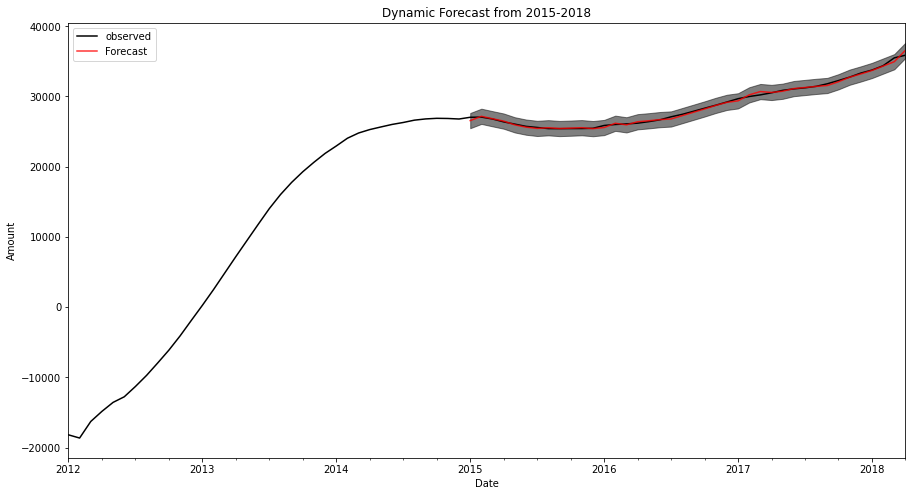

In [111]:
plt.figure(figsize = (15,8))
ax = data_diff['2012':].plot(label='observed',color='black')
pred.predicted_mean.plot(ax=ax, label='Forecast', color='red',alpha=0.8)

ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=0.5)

ax.set_title('Dynamic Forecast from 2015-2018')
ax.set_xlabel('Date')
ax.set_ylabel('Amount')
plt.legend()

plt.show()

Shows the non-dynamic forecast from 2015 to 2018, comparing the predicted values (labeled as "Forecast") to the observed values of the time series. The shaded area represents the confidence interval for the forecasts.

In [112]:
# evaluation

y_forecasted1 = pred.predicted_mean
y_truth1 = data_diff['2015-01-01':]
mean_absolute_percentage_error(y_truth1, y_forecasted1)

0.005456434824328697

The mean absolute percentage error (MAPE) value of 0.0055 indicates that, on average, the forecasted values from the non-dynamic SARIMA model have an absolute percentage error of approximately 0.55%. This means that the forecasted values deviate from the actual values by around 0.55% on average.

The mean absolute percentage error (MAPE) between the forecasted values and the actual values for the time period from 2015 to 2018 is 0.0055, indicating a relatively low error rate.

#### Dynamic Forecast
uses out-of-sample prediction.The model continuously predicts one-step ahead (t+1) and then for the 2nd step ahead (t+2) prediction, it appends predicted value (t+1) to data, re-fits model on new expanded data then makes 2nd step ahead forecast.

In [113]:
pred_dynamic = sari_results.get_prediction(start=pd.to_datetime('2015-01-01'), dynamic=True)
pred_dynamic_ci = pred_dynamic.conf_int()

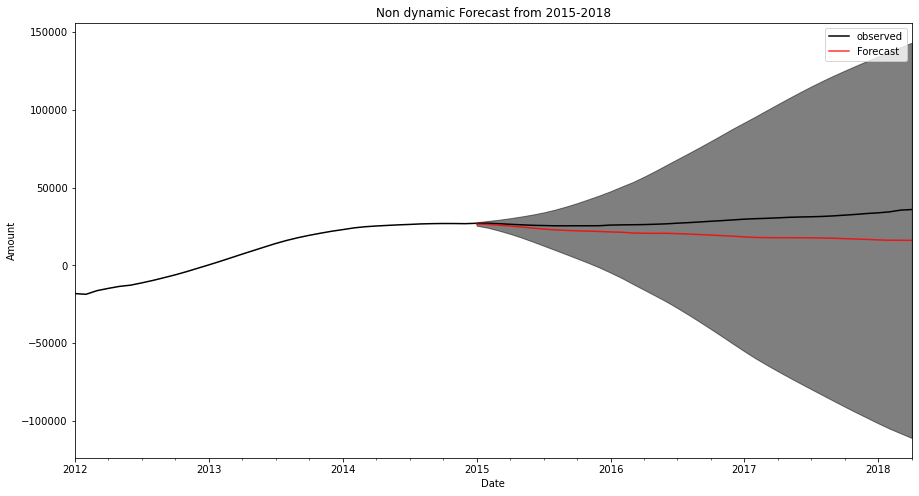

In [114]:
plt.figure(figsize = (15,8))
ax = data_diff['2012':].plot(label='observed',color='black')
pred_dynamic.predicted_mean.plot(ax=ax, label='Forecast', color='red',alpha=0.8)

ax.fill_between(pred_dynamic_ci.index,
                pred_dynamic_ci.iloc[:, 0],
                pred_dynamic_ci.iloc[:, 1], color='k', alpha=.5)

ax.set_title('Non dynamic Forecast from 2015-2018')
ax.set_xlabel('Date')
ax.set_ylabel('Amount')
plt.legend()

plt.show()

In [115]:
# Evaluation
y_forecasted2 = pred_dynamic.predicted_mean
y_truth2 = data_diff['2015-01-01':]
mean_absolute_percentage_error(y_truth2, y_forecasted2)

0.2847633212455102

The non-dynamic forecast plot shows the predicted values compared to the observed values from 2015 to 2018. The forecasted values are represented by the red line, while the observed values are shown in black. The shaded area represents the confidence interval of the forecast.

The mean absolute percentage error (MAPE) between the forecasted values and the actual values for the dynamic forecast is 0.2846, indicating a higher error rate compared to the non-dynamic forecast.

## Future prediction

In [116]:
pred_uc = sari_results.get_forecast(steps=36)#prediction 3 years into the future

# Get confidence intervals of forecasts
pred_ci = pred_uc.conf_int()

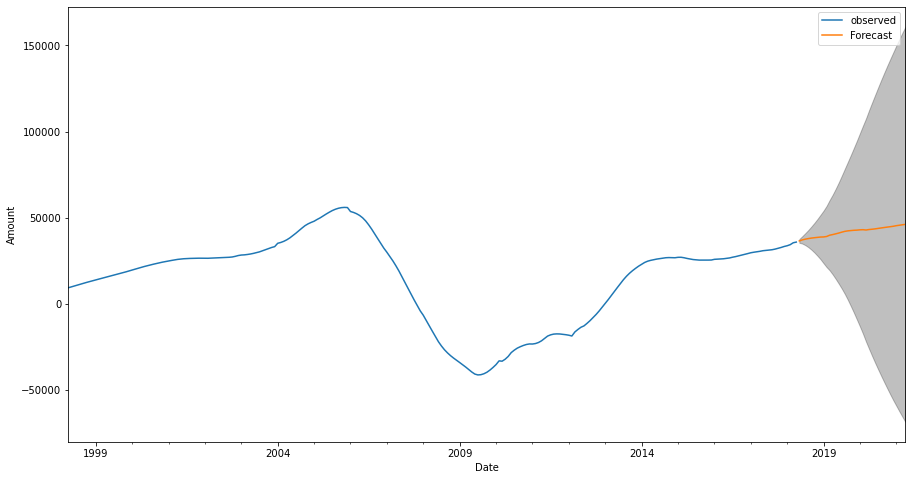

In [117]:
ax = data_diff.plot(label='observed', figsize=(15, 8))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('Amount')

plt.legend()
plt.show()

Our seasonal arima shows a drop in price in the coming years. Lets see the trend with an fbprophet model

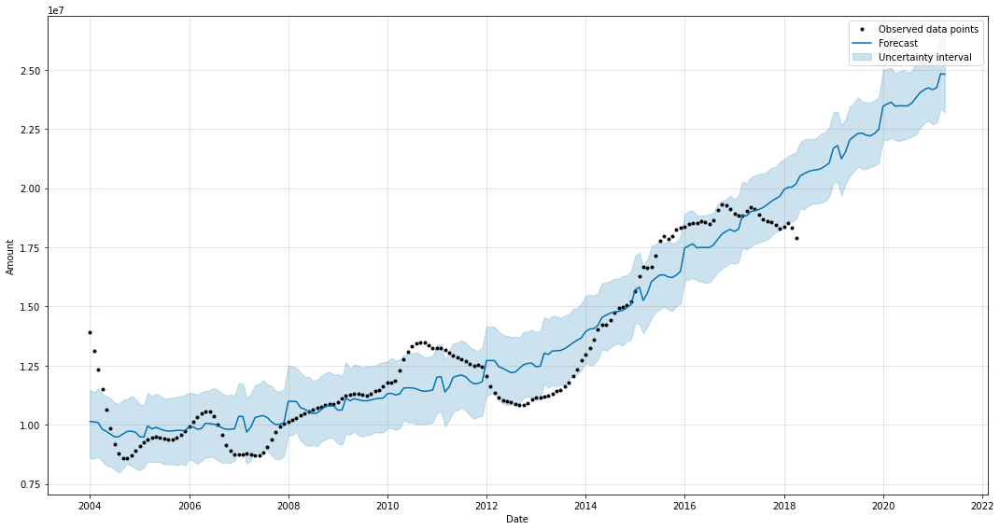

In [118]:
# Create a DataFrame for the future dates
future_dates = m.make_future_dataframe(periods=36, freq='MS')

# Generate the forecast
forecast = m.predict(future_dates)
forecast.index = pd.to_datetime(forecast.index)
# Plot the forecast
fig = m.plot(forecast, xlabel='Date', ylabel='Amount', figsize=(15, 8))

plt.legend()
plt.show()

The trend in the FBProphet model forecast suggests a gradual increase in the price amount over time. The forecasted values, represented by the blue line, show a positive upward trend. This indicates that the price is expected to rise in the future.

The shaded area around the forecast line represents the uncertainty or confidence intervals of the predictions. As we move further into the future, the uncertainty tends to widen, indicating that the model becomes less certain about the exact values.

Overall, the FBProphet model suggests a positive trend in the price amount, indicating a potential increase in the future. 

### Implications of  model evaluation

In the broader picture, the MAPE (Mean Absolute Percentage Error) value of 0.055 (or 5.5% accuracy) obtained from the non-dynamic forecast has significant implications and applications. Let's explore how the insights gained from the model can be useful and impactful in real-world scenarios:

1. **Reliable Forecasting:** The accurate predictions provided by the non-dynamic forecast can be leveraged in various industries and sectors that heavily rely on forecasting. This includes areas such as sales forecasting, demand planning, inventory management, and resource allocation. The model's ability to closely approximate future values can help businesses make informed decisions and optimize their operations.

2. **Financial Planning:** The model's accuracy in predicting time series data can have significant implications in financial planning and investment strategies. Financial institutions, investors, and individuals can utilize these insights to forecast market trends, assess risks, and make informed decisions regarding investments, trading, and portfolio management.

4. **Supply Chain Optimization:** Accurate predictions of future values can play a crucial role in supply chain management. By leveraging the non-dynamic forecast, companies can optimize their inventory levels, minimize stockouts, reduce excess stock, and streamline their production and distribution processes. This can result in cost savings, improved customer satisfaction, and enhanced overall efficiency.

5. **Resource Allocation:** The precise forecasting provided by the model can aid in resource allocation and capacity planning. Whether it's allocating manpower, equipment, or other resources, organizations can make data-driven decisions based on the model's predictions. This can lead to optimized resource utilization, improved productivity, and reduced costs.

6. **Decision Making and Risk Management:** The insights gained from the model can support decision-making processes in various domains. Whether it's strategic planning, policy formulation, or risk management, having accurate predictions enables stakeholders to assess different scenarios, evaluate potential outcomes, and make informed choices.

7. **Performance Evaluation and Benchmarking:** The MAPE value serves as a measure of model performance, allowing for comparisons with other forecasting models or benchmarks. This facilitates continuous improvement in forecasting techniques and helps organizations gauge the effectiveness of their forecasting processes over time.

# Pickling the Final Model

Pickling provides a convenient way to persist and transfer objects, enabling data storage, model persistence, code maintenance, and enhancing security. It plays a crucial role in various domains, such as data science, distributed systems, and code optimization.

In [124]:
# Instantiate the SARIMAX with the best parameters
import joblib
sarima_model_2 = sm.tsa.statespace.SARIMAX(data_diff,
                                order=(3, 1, 3),
                                seasonal_order=(3, 1, 3, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
# pickling the final model

with open("sarima_model_2.pickle", "wb") as f:
    joblib.dump(sarima_model_2,f)

# Conclusion

* Difference in forecast: There is a disparity between your model and the prophet model in terms of the forecasted outcomes. It's important to investigate the reasons behind this variation, considering factors like methodologies, assumptions, and data inputs.

* Higher MAPE in the prophet model: The SARIMA model exhibits a higher Mean Absolute Percentage Error (MAPE)(0.0055) compared to your dynamic model. This suggests that your dynamic model may be more accurate in its forecasts. However, it is crucial to consider additional factors such as model complexity and validation techniques before concluding that your model is superior.

* Analysis of different zip codes: To provide investors with valuable insights, it is essential to conduct a comprehensive analysis of various zip codes. Real estate dynamics and market conditions can differ significantly based on location. By analyzing different zip codes separately, you can offer more precise recommendations tailored to each specific area of interest.

* Train-test split and analysis: Splitting the data into train and test sets is a standard practice in machine learning and forecasting. This allows you to train the model on the training set and evaluate its performance on the test set. Conducting this analysis helps validate and fine-tune your model before making investment decisions, ensuring it can accurately predict outcomes on unseen data.

# Recommendations

* The company should prioritize locations with attractive beaches and abundant outdoor activities, as these areas tend to command higher house prices. This trend can be observed in cities like California and Florida.

* Investors should carefully consider investing in New York due to its potential for high Return On Investment (ROI). However, it's important to acknowledge the associated risk, as future predictions indicate a potential decline in prices.

* It is advisable for the firm to avoid investing in cities such as Boston, New Ulm, New Castle, Ohio, and Dublin due to their high price fluctuations, which in turn pose a significant risk for investors.

* The impact of urbanization on house prices is not necessarily the key determining factor. Investors should shift their focus to other relevant factors when making investment decisions.

In [1]:
# Last Cell